In [24]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/impressionist-classifier-data/validation/validation/Matisse/214108.jpg
/kaggle/input/impressionist-classifier-data/validation/validation/Matisse/214251.jpg
/kaggle/input/impressionist-classifier-data/validation/validation/Matisse/214171.jpg
/kaggle/input/impressionist-classifier-data/validation/validation/Matisse/214070.jpg
/kaggle/input/impressionist-classifier-data/validation/validation/Matisse/9223372032559820515.jpg
/kaggle/input/impressionist-classifier-data/validation/validation/Matisse/214125.jpg
/kaggle/input/impressionist-classifier-data/validation/validation/Matisse/9223372032559821588.jpg
/kaggle/input/impressionist-classifier-data/validation/validation/Matisse/214146.jpg
/kaggle/input/impressionist-classifier-data/validation/validation/Matisse/9223372032559820624.jpg
/kaggle/input/impressionist-classifier-data/validation/validation/Matisse/214050.jpg
/kaggle/input/impressionist-classifier-data/validation/validation/Matisse/214202.jpg
/kaggle/input/impressionis

In [25]:
!pip install -q protobuf==3.20.3


**1-Import of Main Libraries & Seeds**

In [26]:
import os
os.environ["PROTOCOL_BUFFERS_PYTHON_IMPLEMENTATION"] = "python"
os.environ["PYTHONHASHSEED"] = "42"
os.environ["TF_DETERMINISTIC_OPS"] = "1"

import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, Input, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input

# Set seeds
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.keras.utils.set_random_seed(SEED)

try:
    tf.config.experimental.enable_op_determinism(True)
except:
    pass

print("TensorFlow Version:", tf.__version__)


TensorFlow Version: 2.18.0


**2-Preparing CSVs**

In [27]:
# ========== 2. تحميل البيانات ==========
DATASET_ROOT = "/kaggle/input/impressionist-classifier-data/training/training"
image_ext = (".jpg", ".jpeg", ".png", ".bmp", ".gif", ".webp")

data = []
for label in os.listdir(DATASET_ROOT):
    label_path = os.path.join(DATASET_ROOT, label)
    if not os.path.isdir(label_path):
        continue
    for img in os.listdir(label_path):
        if img.lower().endswith(image_ext):
            data.append({"path": os.path.join(label_path, img), "label": label})

df = pd.DataFrame(data)
allowed = ["Cezanne", "Gauguin", "Monet", "Renoir", "VanGogh", "Sargent"]
df = df[df["label"].isin(allowed)].reset_index(drop=True)

print("Total Images:", len(df))
print("Classes:", sorted(df["label"].unique()))

Total Images: 2394
Classes: ['Cezanne', 'Gauguin', 'Monet', 'Renoir', 'Sargent', 'VanGogh']


**SPLIT FILE**

In [28]:
# ========== 3. تقسيم البيانات ==========
train_df, test_df = train_test_split(df, test_size=0.15, stratify=df["label"], random_state=SEED)
train_df, val_df = train_test_split(train_df, test_size=0.15, stratify=train_df["label"], random_state=SEED)

print(f"\nTrain: {len(train_df)}")
print(f"Val: {len(val_df)}")
print(f"Test: {len(test_df)}")


Train: 1728
Val: 306
Test: 360


**-Preparing Images 🛠️**

In [29]:
# ========== 4. ترميز التصنيفات ==========
le = LabelEncoder()
train_df["y"] = le.fit_transform(train_df["label"])
val_df["y"] = le.transform(val_df["label"])
test_df["y"] = le.transform(test_df["label"])

NUM_CLASSES = len(le.classes_)
CLASS_NAMES = list(le.classes_)
print("\nClasses:", CLASS_NAMES)


Classes: ['Cezanne', 'Gauguin', 'Monet', 'Renoir', 'Sargent', 'VanGogh']


**Visualization For Data & Imbalanced labels 📊**

🖼️ Displaying sample images from each class...


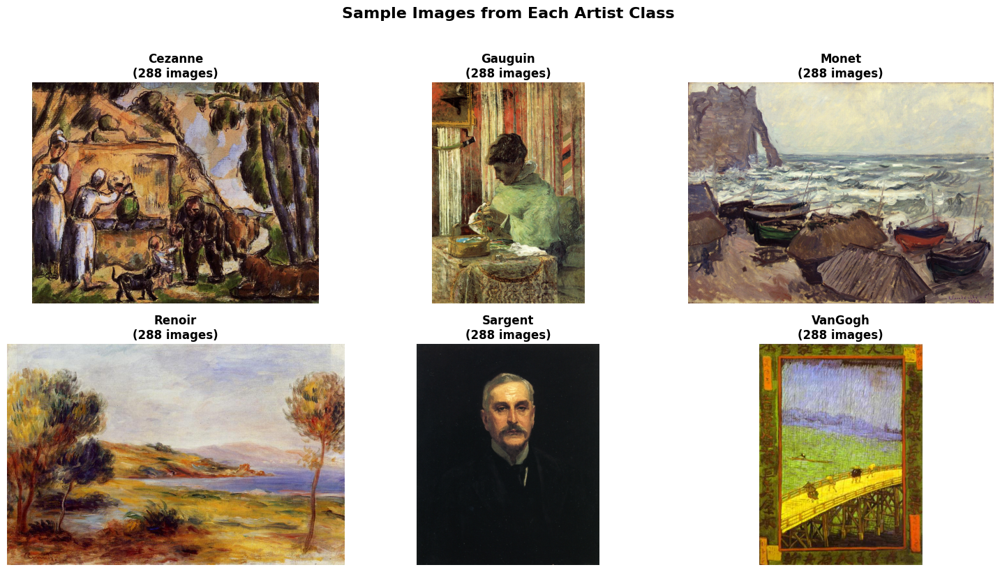


📊 Class Distribution:
----------------------------------------
Cezanne   : Train=288  | Val=51   | Test=60   | Total=399 
Gauguin   : Train=288  | Val=51   | Test=60   | Total=399 
Monet     : Train=288  | Val=51   | Test=60   | Total=399 
Renoir    : Train=288  | Val=51   | Test=60   | Total=399 
Sargent   : Train=288  | Val=51   | Test=60   | Total=399 
VanGogh   : Train=288  | Val=51   | Test=60   | Total=399 


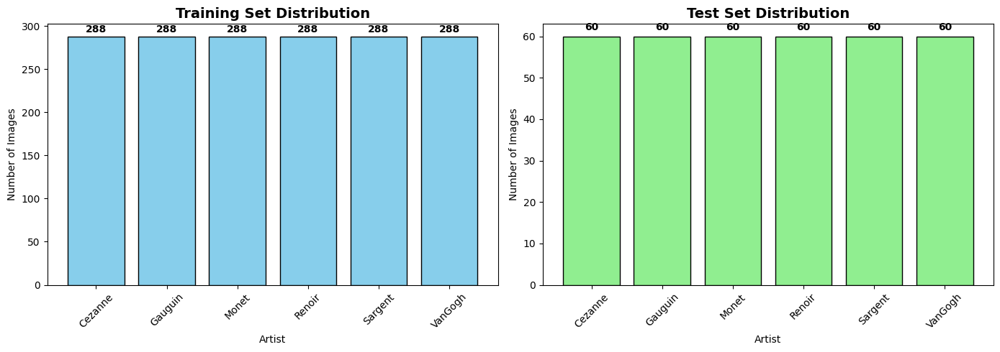


📈 Dataset Summary:
Total Images: 2394
Training Set: 1728 images (72.2%)
Validation Set: 306 images (12.8%)
Test Set: 360 images (15.0%)
Number of Classes: 6


In [30]:
# ============================================
# DISPLAY SAMPLE IMAGES FOR EACH CLASS
# ============================================

print(" Displaying sample images from each class...")

# استخدم PIL بدل cv2
from PIL import Image

# حدد عدد الصور
classes = CLASS_NAMES  # ['Cezanne', 'Gauguin', 'Monet', 'Renoir', 'Sargent', 'VanGogh']
num_classes = len(classes)

# إنشاء subplot
rows = 2
cols = 3
plt.figure(figsize=(15, 8))

for i, artist in enumerate(classes):
    # جلب أول صورة من كل فئة
    class_images = train_df[train_df["label"] == artist]
    
    if len(class_images) > 0:
        img_path = class_images.iloc[0]["path"]
        
        try:
            # تحميل الصورة باستخدام PIL
            img = Image.open(img_path).convert('RGB')
            
            # عرض الصورة
            plt.subplot(rows, cols, i+1)
            plt.imshow(img)
            plt.axis("off")
            plt.title(f"{artist}\n({len(class_images)} images)", fontsize=12, fontweight='bold')
            
        except Exception as e:
            plt.subplot(rows, cols, i+1)
            plt.text(0.5, 0.5, f"Error\n{artist}", 
                    ha='center', va='center', transform=plt.gca().transAxes)
            plt.axis("off")
    else:
        plt.subplot(rows, cols, i+1)
        plt.text(0.5, 0.5, f"No images\n{artist}", 
                ha='center', va='center', transform=plt.gca().transAxes)
        plt.axis("off")

plt.suptitle("Sample Images from Each Artist Class", fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# عرض إحصائيات كل فئة
print("\n Class Distribution:")
print("-"*40)

for artist in classes:
    train_count = len(train_df[train_df["label"] == artist])
    val_count = len(val_df[val_df["label"] == artist])
    test_count = len(test_df[test_df["label"] == artist])
    
    print(f"{artist:<10}: Train={train_count:<4} | Val={val_count:<4} | Test={test_count:<4} | Total={train_count+val_count+test_count:<4}")

# رسم بياني للتوزيع
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Train distribution
train_counts = [len(train_df[train_df["label"] == artist]) for artist in classes]
axes[0].bar(classes, train_counts, color='skyblue', edgecolor='black')
axes[0].set_title('Training Set Distribution', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Artist')
axes[0].set_ylabel('Number of Images')
axes[0].tick_params(axis='x', rotation=45)

# إضافة القيم على الأعمدة
for i, count in enumerate(train_counts):
    axes[0].text(i, count + 2, str(count), ha='center', va='bottom', fontweight='bold')

# Test distribution
test_counts = [len(test_df[test_df["label"] == artist]) for artist in classes]
axes[1].bar(classes, test_counts, color='lightgreen', edgecolor='black')
axes[1].set_title('Test Set Distribution', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Artist')
axes[1].set_ylabel('Number of Images')
axes[1].tick_params(axis='x', rotation=45)

# إضافة القيم على الأعمدة
for i, count in enumerate(test_counts):
    axes[1].text(i, count + 1, str(count), ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

# إحصائيات إجمالية
print("\n Dataset Summary:")
print("="*40)
print(f"Total Images: {len(df)}")
print(f"Training Set: {len(train_df)} images ({len(train_df)/len(df)*100:.1f}%)")
print(f"Validation Set: {len(val_df)} images ({len(val_df)/len(df)*100:.1f}%)")
print(f"Test Set: {len(test_df)} images ({len(test_df)/len(df)*100:.1f}%)")
print(f"Number of Classes: {NUM_CLASSES}")

**3-EFFICIENTB0**

In [31]:
# ========== 5. إعداد Image Data Generators ==========
IMG_SIZE = 224
BATCH_SIZE = 32

train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=20,
    zoom_range=0.2,
    width_shift_range=0.15,
    height_shift_range=0.15,
    horizontal_flip=True
)

val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

train_generator = train_datagen.flow_from_dataframe(
    train_df, x_col="path", y_col="y",
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="raw",
    shuffle=True,
    seed=SEED
)

val_generator = val_datagen.flow_from_dataframe(
    val_df, x_col="path", y_col="y",
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="raw",
    shuffle=False
)

test_generator = test_datagen.flow_from_dataframe(
    test_df, x_col="path", y_col="y",
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="raw",
    shuffle=False
)

print("\nData generators ready!")

Found 1728 validated image filenames.
Found 306 validated image filenames.
Found 360 validated image filenames.

Data generators ready!


BUILD EFFICIENTB0

In [32]:
# ========== 6. بناء النموذج ==========
print("\n" + "="*50)
print("Building EfficientNetB0 Model")
print("="*50)

# Load base model
base_model = EfficientNetB0(
    weights='imagenet',
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)
base_model.trainable = False  # Freeze base model

# Add custom layers
inputs = Input(shape=(IMG_SIZE, IMG_SIZE, 3))
x = base_model(inputs, training=False)
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)
x = Dense(256, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)
outputs = Dense(NUM_CLASSES, activation='softmax')(x)

model = Model(inputs, outputs, name="EfficientNetB0")

# Compile model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()


Building EfficientNetB0 Model


I0000 00:00:1766052257.255240      47 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1766052257.255901      47 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "EfficientNetB0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │         1,542 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,385,193 (16.73 MB)

 Trainable params: 332,550 (1.27 MB)

 Non-trainable params: 4,052,643 (15.46 MB)

TRAINING

In [33]:
# ========== 7. تدريب النموذج ==========
print("\n" + "="*50)
print("Training Model")
print("="*50)

# Callbacks
callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6),
    ModelCheckpoint("best_model.h5", monitor='val_accuracy', save_best_only=True)
]

# Train
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=30,
    callbacks=callbacks,
    verbose=1
)

# Fine-tuning
print("\n" + "="*50)
print("Fine-tuning")
print("="*50)

base_model.trainable = True
for layer in base_model.layers[:-20]:
    layer.trainable = False

model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

history_fine = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=15,
    callbacks=[EarlyStopping(monitor='val_accuracy', patience=5)],
    verbose=1
)

#  
# Combine histories CORRECTLY
print("\nCombining training histories...")

# Create a new combined history
combined_history = {
    'accuracy': [],
    'val_accuracy': [],
    'loss': [],
    'val_loss': []
}

# Add from first training phase
for key in ['accuracy', 'val_accuracy', 'loss', 'val_loss']:
    if key in history.history:
        combined_history[key].extend(history.history[key])

# Add from fine-tuning phase  
for key in ['accuracy', 'val_accuracy', 'loss', 'val_loss']:
    if key in history_fine.history:
        combined_history[key].extend(history_fine.history[key])

print("Histories combined successfully!")

# Optionally, if you want to keep using 'history' variable:
# Update the original history with combined results
history.history = combined_history


Training Model


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30


E0000 00:00:1766052276.635288      47 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/EfficientNetB0_1/efficientnetb0_1/block2b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
I0000 00:00:1766052278.184745     148 cuda_dnn.cc:529] Loaded cuDNN version 90300


54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 933ms/step - accuracy: 0.4322 - loss: 1.8204

54/54 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - accuracy: 0.4344 - loss: 1.8130 - val_accuracy: 0.6307 - val_loss: 1.0545 - learning_rate: 0.0010
Epoch 2/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 753ms/step - accuracy: 0.7149 - loss: 0.8475

54/54 ━━━━━━━━━━━━━━━━━━━━ 46s 848ms/step - accuracy: 0.7150 - loss: 0.8475 - val_accuracy: 0.7288 - val_loss: 0.8405 - learning_rate: 0.0010
Epoch 3/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 841ms/step - accuracy: 0.7652 - loss: 0.6780 - val_accuracy: 0.7222 - val_loss: 0.8165 - learning_rate: 0.0010
Epoch 4/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 841ms/step - accuracy: 0.7779 - loss: 0.6063 - val_accuracy: 0.7190 - val_loss: 0.8007 - learning_rate: 0.0010
Epoch 5/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 749ms/step - accuracy: 0.7824 - loss: 0.6183

54/54 ━━━━━━━━━━━━━━━━━━━━ 46s 844ms/step - accuracy: 0.7826 - loss: 0.6178 - val_accuracy: 0.7680 - val_loss: 0.7573 - learning_rate: 0.0010
Epoch 6/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 843ms/step - accuracy: 0.8102 - loss: 0.5392 - val_accuracy: 0.7582 - val_loss: 0.7547 - learning_rate: 0.0010
Epoch 7/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 831ms/step - accuracy: 0.8211 - loss: 0.4831 - val_accuracy: 0.7614 - val_loss: 0.7923 - learning_rate: 0.0010
Epoch 8/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 834ms/step - accuracy: 0.8539 - loss: 0.4249 - val_accuracy: 0.7680 - val_loss: 0.7969 - learning_rate: 0.0010
Epoch 9/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 842ms/step - accuracy: 0.8333 - loss: 0.4766 - val_accuracy: 0.7614 - val_loss: 0.7903 - learning_rate: 0.0010
Epoch 10/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 843ms/step - accuracy: 0.8509 - loss: 0.4289 - val_accuracy: 0.7614 - val_loss: 0.8108 - learning_rate: 0.0010
Epoch 11/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 836ms/step - accuracy: 0.8497 - loss: 0.4277 - va

54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 837ms/step - accuracy: 0.8711 - loss: 0.3660 - val_accuracy: 0.7974 - val_loss: 0.7624 - learning_rate: 5.0000e-04
Epoch 13/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 833ms/step - accuracy: 0.8830 - loss: 0.3566 - val_accuracy: 0.7941 - val_loss: 0.7278 - learning_rate: 5.0000e-04
Epoch 14/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 836ms/step - accuracy: 0.8844 - loss: 0.3561 - val_accuracy: 0.7908 - val_loss: 0.7640 - learning_rate: 5.0000e-04
Epoch 15/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 46s 839ms/step - accuracy: 0.8635 - loss: 0.4008 - val_accuracy: 0.7941 - val_loss: 0.7096 - learning_rate: 5.0000e-04
Epoch 16/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 831ms/step - accuracy: 0.8837 - loss: 0.3375 - val_accuracy: 0.7712 - val_loss: 0.7403 - learning_rate: 5.0000e-04
Epoch 17/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 834ms/step - accuracy: 0.8841 - loss: 0.3612 - val_accuracy: 0.7941 - val_loss: 0.7296 - learning_rate: 5.0000e-04
Epoch 18/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 827ms/step - accuracy

E0000 00:00:1766053310.076364      47 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/EfficientNetB0_1/efficientnetb0_1/block2b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


54/54 ━━━━━━━━━━━━━━━━━━━━ 71s 963ms/step - accuracy: 0.7821 - loss: 0.6301 - val_accuracy: 0.7778 - val_loss: 0.8025
Epoch 2/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 831ms/step - accuracy: 0.8504 - loss: 0.4142 - val_accuracy: 0.7810 - val_loss: 0.8146
Epoch 3/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 830ms/step - accuracy: 0.8554 - loss: 0.3898 - val_accuracy: 0.7647 - val_loss: 0.7900
Epoch 4/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 833ms/step - accuracy: 0.8763 - loss: 0.3216 - val_accuracy: 0.7908 - val_loss: 0.7504
Epoch 5/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 840ms/step - accuracy: 0.8786 - loss: 0.3193 - val_accuracy: 0.8007 - val_loss: 0.7717
Epoch 6/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 840ms/step - accuracy: 0.8978 - loss: 0.3005 - val_accuracy: 0.7778 - val_loss: 0.7516
Epoch 7/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 839ms/step - accuracy: 0.9179 - loss: 0.2476 - val_accuracy: 0.7876 - val_loss: 0.7500
Epoch 8/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 45s 839ms/step - accuracy: 0.9201 - loss: 0.2372 - val_accuracy: 0.807

EVALUATE EFFICIENTBO & CONV MATRIX

In [34]:
print("\n" + "="*60)
print("MODEL EVALUATION - EfficientNetB0")
print("="*60)

# Make predictions
print("\nMaking predictions on test set...")
test_generator.reset()
predictions = model.predict(test_generator, verbose=1)
y_pred = np.argmax(predictions, axis=1)

# Get true labels
print("\nGetting true labels...")
test_generator.reset()
y_true = []
for i in range(len(test_generator)):
    _, batch_y = test_generator[i]
    y_true.extend(batch_y)
y_true = np.array(y_true)

# Calculate accuracy
accuracy = accuracy_score(y_true, y_pred)
print(f"\nTest Accuracy: {accuracy:.4f} ({accuracy*100:.2f}%)")

# Classification report
print("\n" + "-"*60)
print("CLASSIFICATION REPORT")
print("-"*60)
print(classification_report(y_true, y_pred, target_names=CLASS_NAMES))

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)


MODEL EVALUATION - EfficientNetB0

Making predictions on test set...
12/12 ━━━━━━━━━━━━━━━━━━━━ 13s 883ms/step

Getting true labels...

Test Accuracy: 0.8111 (81.11%)

------------------------------------------------------------
CLASSIFICATION REPORT
------------------------------------------------------------
              precision    recall  f1-score   support

     Cezanne       0.95      0.88      0.91        60
     Gauguin       0.69      0.83      0.76        60
       Monet       0.78      0.72      0.75        60
      Renoir       0.94      0.73      0.82        60
     Sargent       0.81      0.83      0.82        60
     VanGogh       0.76      0.87      0.81        60

    accuracy                           0.81       360
   macro avg       0.82      0.81      0.81       360
weighted avg       0.82      0.81      0.81       360



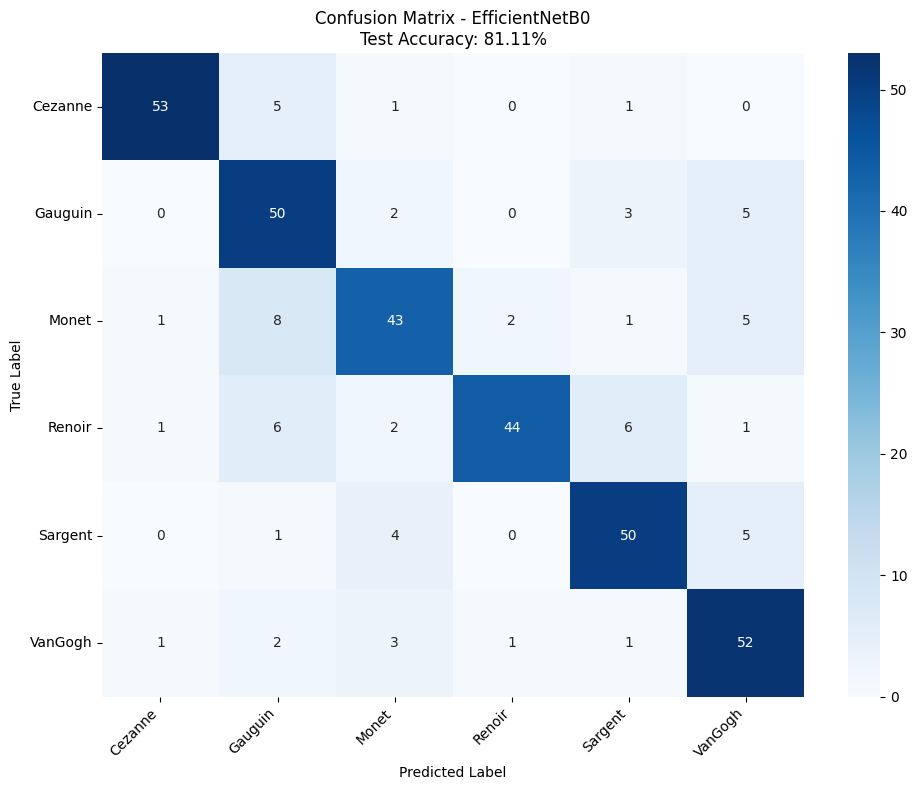

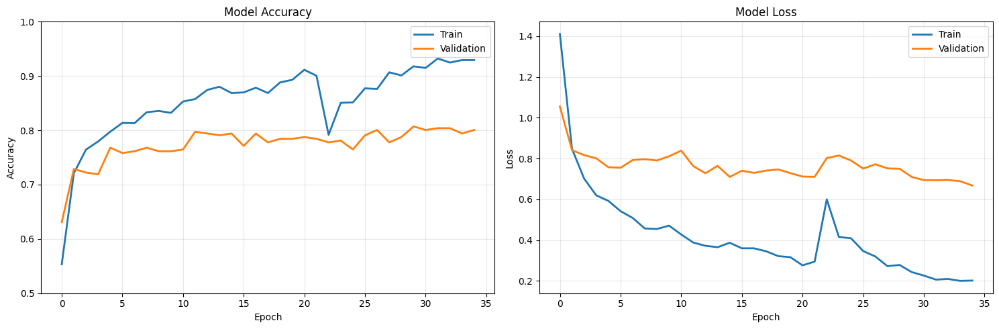

In [35]:
# Plot 1: Confusion Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
           xticklabels=CLASS_NAMES,
           yticklabels=CLASS_NAMES,
           annot_kws={"size": 10})
plt.title(f'Confusion Matrix - EfficientNetB0\nTest Accuracy: {accuracy*100:.2f}%')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig('confusion_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

# Plot 2: Training History
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Accuracy plot
axes[0].plot(combined_history['accuracy'], label='Train', linewidth=2)
axes[0].plot(combined_history['val_accuracy'], label='Validation', linewidth=2)
axes[0].set_title('Model Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()
axes[0].grid(True, alpha=0.3)
axes[0].set_ylim([0.5, 1.0])

# Loss plot
axes[1].plot(combined_history['loss'], label='Train', linewidth=2)
axes[1].plot(combined_history['val_loss'], label='Validation', linewidth=2)
axes[1].set_title('Model Loss')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('training_history.png', dpi=300, bbox_inches='tight')
plt.show()

TEST BY EFFICIENTB0


TESTING MODEL WITH SAMPLE IMAGES


2025-12-18 10:32:06.710222: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}


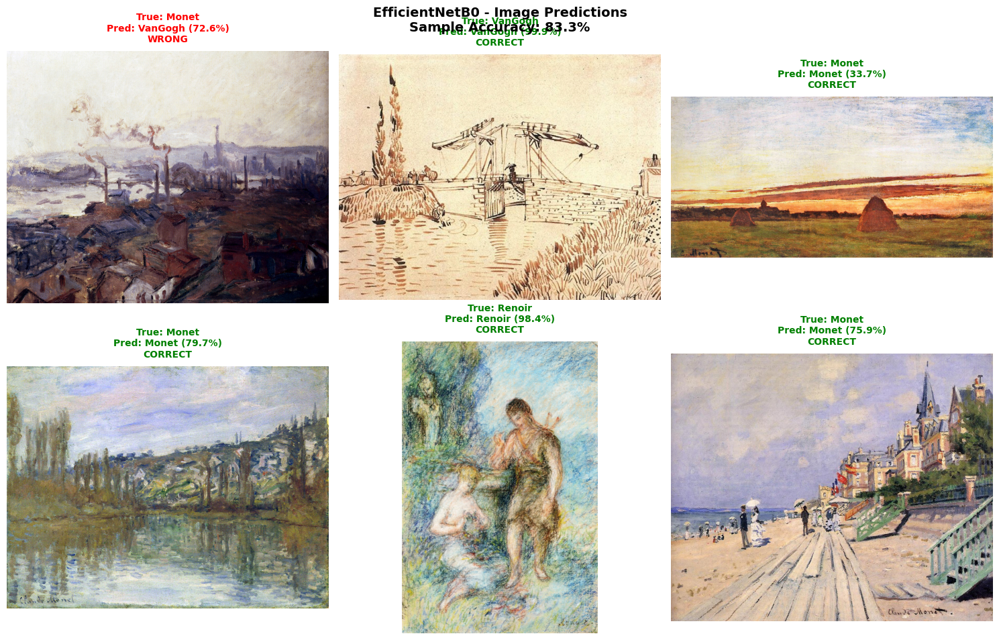


Sample Prediction Accuracy: 5/6 (83.3%)


In [36]:
print("\n" + "="*60)
print("TESTING MODEL WITH SAMPLE IMAGES")
print("="*60)

from PIL import Image

def predict_image(image_path, model, class_names, img_size=224):
    """Predict class for a single image"""
    # Load and preprocess image
    img = Image.open(image_path).convert('RGB')
    img_resized = img.resize((img_size, img_size))
    
    # Convert to array and preprocess
    img_array = np.array(img_resized)
    from tensorflow.keras.applications.efficientnet import preprocess_input
    img_array = preprocess_input(img_array[np.newaxis, ...])
    
    # Make prediction
    predictions = model.predict(img_array, verbose=0)[0]
    
    # Get top 3 predictions
    top_3_idx = np.argsort(predictions)[-3:][::-1]
    top_3_classes = [class_names[i] for i in top_3_idx]
    top_3_probs = [predictions[i] for i in top_3_idx]
    
    return top_3_classes, top_3_probs, img

# Select 6 random test images
np.random.seed(SEED)
sample_indices = np.random.choice(len(test_df), 6, replace=False)

# Create figure
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.ravel()

correct = 0
total = 0

for idx, ax in enumerate(axes):
    if idx < len(sample_indices):
        sample_idx = sample_indices[idx]
        img_path = test_df.iloc[sample_idx]["path"]
        true_label = test_df.iloc[sample_idx]["label"]
        
        # Predict
        top_classes, top_probs, img = predict_image(img_path, model, CLASS_NAMES)
        pred_label = top_classes[0]
        pred_conf = top_probs[0] * 100
        
        # Display image
        ax.imshow(img)
        ax.axis('off')
        
        # Check if correct
        total += 1
        if true_label == pred_label:
            correct += 1
            color = 'green'
            result = "CORRECT"
        else:
            color = 'red'
            result = "WRONG"
        
        # Add title
        title = f"True: {true_label}\nPred: {pred_label} ({pred_conf:.1f}%)\n{result}"
        ax.set_title(title, color=color, fontsize=10, fontweight='bold', pad=10)
        
        # Add colored border
        for spine in ax.spines.values():
            spine.set_edgecolor(color)
            spine.set_linewidth(3)

# Remove empty axes
for idx in range(len(sample_indices), len(axes)):
    axes[idx].axis('off')

sample_accuracy = correct / total if total > 0 else 0
plt.suptitle(f'EfficientNetB0 - Image Predictions\nSample Accuracy: {sample_accuracy:.1%}', 
            fontsize=14, fontweight='bold', y=0.95)
plt.tight_layout()
plt.savefig('image_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\nSample Prediction Accuracy: {correct}/{total} ({sample_accuracy:.1%})")

**4-vgg16**

BUILD & TRAIN

In [37]:
# ============================================
# VGG16 MODEL 
# ============================================

print("\n" + "="*60)
print("VGG16 MODEL TRAINING")
print("="*60)

# 1. Import VGG16 specific modules
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input as vgg_preprocess

# 2. Create VGG16 generators
IMG_SIZE = 224  # VGG16 expects 224x224
BATCH_SIZE = 32

print("\n1. Creating VGG16 data generators...")

vgg_train_datagen = ImageDataGenerator(
    preprocessing_function=vgg_preprocess,
    rotation_range=20,
    zoom_range=0.2,
    width_shift_range=0.15,
    height_shift_range=0.15,
    horizontal_flip=True
)

vgg_val_datagen = ImageDataGenerator(preprocessing_function=vgg_preprocess)
vgg_test_datagen = ImageDataGenerator(preprocessing_function=vgg_preprocess)

vgg_train_generator = vgg_train_datagen.flow_from_dataframe(
    train_df, x_col="path", y_col="y",
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="raw",
    shuffle=True,
    seed=SEED
)

vgg_val_generator = vgg_val_datagen.flow_from_dataframe(
    val_df, x_col="path", y_col="y",
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="raw",
    shuffle=False
)

vgg_test_generator = vgg_test_datagen.flow_from_dataframe(
    test_df, x_col="path", y_col="y",
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="raw",
    shuffle=False
)

print(f"Train batches: {len(vgg_train_generator)}")
print(f"Val batches: {len(vgg_val_generator)}")
print(f"Test batches: {len(vgg_test_generator)}")

# 3. Build VGG16 model
print("\n2. Building VGG16 model...")

vgg_base = VGG16(
    weights='imagenet',
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)
vgg_base.trainable = False  # Freeze base model

# Add custom layers
inputs = Input(shape=(IMG_SIZE, IMG_SIZE, 3))
x = vgg_base(inputs, training=False)
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)  # Higher dropout for VGG
x = Dense(256, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
outputs = Dense(NUM_CLASSES, activation='softmax')(x)

vgg_model = Model(inputs, outputs, name="VGG16")

# Display model summary
vgg_model.summary()

# 4. Compile model
print("\n3. Compiling VGG16 model...")

vgg_model.compile(
    optimizer=Adam(learning_rate=0.0001),  # Lower learning rate for VGG
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# 5. Train model
print("\n4. Training VGG16 model...")

vgg_callbacks = [
    EarlyStopping(
        monitor='val_accuracy',
        patience=12,
        restore_best_weights=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=6,
        min_lr=1e-7,
        verbose=1
    ),
    ModelCheckpoint(
        filepath="best_vgg16.h5",
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

vgg_history = vgg_model.fit(
    vgg_train_generator,
    validation_data=vgg_val_generator,
    epochs=30,
    callbacks=vgg_callbacks,
    verbose=1
)

# 6. Fine-tuning
print("\n5. Fine-tuning VGG16...")

# Unfreeze last 4 blocks (block4 and block5)
vgg_base.trainable = True
for layer in vgg_base.layers[:15]:  # Freeze first 15 layers
    layer.trainable = False

# Recompile with lower learning rate
vgg_model.compile(
    optimizer=Adam(learning_rate=0.00001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Fine-tune
vgg_history_fine = vgg_model.fit(
    vgg_train_generator,
    validation_data=vgg_val_generator,
    epochs=15,
    callbacks=[
        EarlyStopping(monitor='val_accuracy', patience=8, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4)
    ],
    verbose=1
)

print("\nVGG16 training completed!")


VGG16 MODEL TRAINING

1. Creating VGG16 data generators...
Found 1728 validated image filenames.
Found 306 validated image filenames.
Found 360 validated image filenames.
Train batches: 54
Val batches: 10
Test batches: 12

2. Building VGG16 model...
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "VGG16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │         1,542 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,850,630 (56.65 MB)

 Trainable params: 134,406 (525.02 KB)

 Non-trainable params: 14,716,224 (56.14 MB)


3. Compiling VGG16 model...

4. Training VGG16 model...


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 802ms/step - accuracy: 0.1809 - loss: 2.7676
Epoch 1: val_accuracy improved from -inf to 0.31699, saving model to best_vgg16.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 54s 934ms/step - accuracy: 0.1810 - loss: 2.7669 - val_accuracy: 0.3170 - val_loss: 2.0698 - learning_rate: 1.0000e-04
Epoch 2/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 795ms/step - accuracy: 0.2673 - loss: 2.4248
Epoch 2: val_accuracy improved from 0.31699 to 0.41830, saving model to best_vgg16.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 48s 894ms/step - accuracy: 0.2675 - loss: 2.4243 - val_accuracy: 0.4183 - val_loss: 1.6387 - learning_rate: 1.0000e-04
Epoch 3/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 810ms/step - accuracy: 0.3197 - loss: 2.1971
Epoch 3: val_accuracy improved from 0.41830 to 0.50980, saving model to best_vgg16.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 49s 910ms/step - accuracy: 0.3198 - loss: 2.1959 - val_accuracy: 0.5098 - val_loss: 1.4532 - learning_rate: 1.0000e-04
Epoch 4/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 801ms/step - accuracy: 0.3749 - loss: 2.0148
Epoch 4: val_accuracy improved from 0.50980 to 0.56209, saving model to best_vgg16.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 49s 901ms/step - accuracy: 0.3748 - loss: 2.0147 - val_accuracy: 0.5621 - val_loss: 1.3417 - learning_rate: 1.0000e-04
Epoch 5/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 796ms/step - accuracy: 0.4188 - loss: 1.8254
Epoch 5: val_accuracy improved from 0.56209 to 0.57516, saving model to best_vgg16.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 48s 897ms/step - accuracy: 0.4187 - loss: 1.8253 - val_accuracy: 0.5752 - val_loss: 1.2821 - learning_rate: 1.0000e-04
Epoch 6/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 797ms/step - accuracy: 0.4394 - loss: 1.7573
Epoch 6: val_accuracy improved from 0.57516 to 0.58824, saving model to best_vgg16.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 48s 900ms/step - accuracy: 0.4394 - loss: 1.7572 - val_accuracy: 0.5882 - val_loss: 1.2336 - learning_rate: 1.0000e-04
Epoch 7/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 806ms/step - accuracy: 0.4471 - loss: 1.6311
Epoch 7: val_accuracy improved from 0.58824 to 0.59477, saving model to best_vgg16.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 49s 904ms/step - accuracy: 0.4473 - loss: 1.6316 - val_accuracy: 0.5948 - val_loss: 1.2010 - learning_rate: 1.0000e-04
Epoch 8/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 798ms/step - accuracy: 0.4697 - loss: 1.6668
Epoch 8: val_accuracy improved from 0.59477 to 0.59804, saving model to best_vgg16.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 48s 897ms/step - accuracy: 0.4698 - loss: 1.6658 - val_accuracy: 0.5980 - val_loss: 1.1695 - learning_rate: 1.0000e-04
Epoch 9/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 792ms/step - accuracy: 0.5054 - loss: 1.5313
Epoch 9: val_accuracy improved from 0.59804 to 0.60458, saving model to best_vgg16.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 48s 892ms/step - accuracy: 0.5055 - loss: 1.5305 - val_accuracy: 0.6046 - val_loss: 1.1486 - learning_rate: 1.0000e-04
Epoch 10/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 805ms/step - accuracy: 0.4827 - loss: 1.5251
Epoch 10: val_accuracy improved from 0.60458 to 0.61765, saving model to best_vgg16.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 49s 907ms/step - accuracy: 0.4827 - loss: 1.5256 - val_accuracy: 0.6176 - val_loss: 1.1251 - learning_rate: 1.0000e-04
Epoch 11/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 802ms/step - accuracy: 0.5042 - loss: 1.4414
Epoch 11: val_accuracy did not improve from 0.61765
54/54 ━━━━━━━━━━━━━━━━━━━━ 48s 899ms/step - accuracy: 0.5043 - loss: 1.4424 - val_accuracy: 0.6176 - val_loss: 1.1050 - learning_rate: 1.0000e-04
Epoch 12/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 803ms/step - accuracy: 0.5128 - loss: 1.4535
Epoch 12: val_accuracy did not improve from 0.61765
54/54 ━━━━━━━━━━━━━━━━━━━━ 49s 901ms/step - accuracy: 0.5130 - loss: 1.4528 - val_accuracy: 0.6144 - val_loss: 1.0901 - learning_rate: 1.0000e-04
Epoch 13/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 794ms/step - accuracy: 0.5497 - loss: 1.3602
Epoch 13: val_accuracy improved from 0.61765 to 0.63399, saving model to best_vgg16.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 48s 893ms/step - accuracy: 0.5494 - loss: 1.3606 - val_accuracy: 0.6340 - val_loss: 1.0822 - learning_rate: 1.0000e-04
Epoch 14/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 806ms/step - accuracy: 0.5233 - loss: 1.4247
Epoch 14: val_accuracy did not improve from 0.63399
54/54 ━━━━━━━━━━━━━━━━━━━━ 49s 904ms/step - accuracy: 0.5235 - loss: 1.4241 - val_accuracy: 0.6307 - val_loss: 1.0599 - learning_rate: 1.0000e-04
Epoch 15/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 801ms/step - accuracy: 0.5226 - loss: 1.3995
Epoch 15: val_accuracy did not improve from 0.63399
54/54 ━━━━━━━━━━━━━━━━━━━━ 48s 897ms/step - accuracy: 0.5229 - loss: 1.3991 - val_accuracy: 0.6340 - val_loss: 1.0511 - learning_rate: 1.0000e-04
Epoch 16/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 798ms/step - accuracy: 0.5312 - loss: 1.3695
Epoch 16: val_accuracy improved from 0.63399 to 0.63725, saving model to best_vgg16.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 48s 899ms/step - accuracy: 0.5314 - loss: 1.3686 - val_accuracy: 0.6373 - val_loss: 1.0469 - learning_rate: 1.0000e-04
Epoch 17/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 799ms/step - accuracy: 0.5650 - loss: 1.2803
Epoch 17: val_accuracy improved from 0.63725 to 0.65033, saving model to best_vgg16.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 49s 899ms/step - accuracy: 0.5652 - loss: 1.2801 - val_accuracy: 0.6503 - val_loss: 1.0353 - learning_rate: 1.0000e-04
Epoch 18/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 796ms/step - accuracy: 0.5879 - loss: 1.2742
Epoch 18: val_accuracy did not improve from 0.65033
54/54 ━━━━━━━━━━━━━━━━━━━━ 48s 895ms/step - accuracy: 0.5880 - loss: 1.2740 - val_accuracy: 0.6438 - val_loss: 1.0269 - learning_rate: 1.0000e-04
Epoch 19/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 795ms/step - accuracy: 0.5662 - loss: 1.2804
Epoch 19: val_accuracy improved from 0.65033 to 0.65686, saving model to best_vgg16.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 48s 895ms/step - accuracy: 0.5663 - loss: 1.2801 - val_accuracy: 0.6569 - val_loss: 1.0176 - learning_rate: 1.0000e-04
Epoch 20/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 797ms/step - accuracy: 0.5724 - loss: 1.2575
Epoch 20: val_accuracy did not improve from 0.65686
54/54 ━━━━━━━━━━━━━━━━━━━━ 48s 895ms/step - accuracy: 0.5727 - loss: 1.2570 - val_accuracy: 0.6471 - val_loss: 1.0103 - learning_rate: 1.0000e-04
Epoch 21/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 800ms/step - accuracy: 0.6075 - loss: 1.1391
Epoch 21: val_accuracy did not improve from 0.65686
54/54 ━━━━━━━━━━━━━━━━━━━━ 48s 898ms/step - accuracy: 0.6076 - loss: 1.1393 - val_accuracy: 0.6503 - val_loss: 1.0019 - learning_rate: 1.0000e-04
Epoch 22/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 806ms/step - accuracy: 0.5901 - loss: 1.1875
Epoch 22: val_accuracy did not improve from 0.65686
54/54 ━━━━━━━━━━━━━━━━━━━━ 49s 906ms/step - accuracy: 0.5903 - loss: 1.1871 - val_accuracy: 0.6471 - val_loss: 0.9986 - learning_rate: 1.0000e-04

54/54 ━━━━━━━━━━━━━━━━━━━━ 49s 906ms/step - accuracy: 0.6083 - loss: 1.0999 - val_accuracy: 0.6667 - val_loss: 0.9937 - learning_rate: 1.0000e-04
Epoch 27/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 797ms/step - accuracy: 0.5998 - loss: 1.1856
Epoch 27: val_accuracy did not improve from 0.66667
54/54 ━━━━━━━━━━━━━━━━━━━━ 48s 895ms/step - accuracy: 0.6000 - loss: 1.1846 - val_accuracy: 0.6601 - val_loss: 0.9893 - learning_rate: 1.0000e-04
Epoch 28/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 802ms/step - accuracy: 0.6091 - loss: 1.1379
Epoch 28: val_accuracy did not improve from 0.66667
54/54 ━━━━━━━━━━━━━━━━━━━━ 48s 899ms/step - accuracy: 0.6093 - loss: 1.1379 - val_accuracy: 0.6667 - val_loss: 0.9784 - learning_rate: 1.0000e-04
Epoch 29/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 795ms/step - accuracy: 0.6198 - loss: 1.1069
Epoch 29: val_accuracy improved from 0.66667 to 0.66993, saving model to best_vgg16.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 48s 895ms/step - accuracy: 0.6197 - loss: 1.1078 - val_accuracy: 0.6699 - val_loss: 0.9737 - learning_rate: 1.0000e-04
Epoch 30/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 803ms/step - accuracy: 0.6258 - loss: 1.0785
Epoch 30: val_accuracy did not improve from 0.66993
54/54 ━━━━━━━━━━━━━━━━━━━━ 49s 903ms/step - accuracy: 0.6259 - loss: 1.0787 - val_accuracy: 0.6667 - val_loss: 0.9746 - learning_rate: 1.0000e-04
Restoring model weights from the end of the best epoch: 29.

5. Fine-tuning VGG16...
Epoch 1/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 55s 948ms/step - accuracy: 0.6195 - loss: 1.1341 - val_accuracy: 0.6928 - val_loss: 1.0367 - learning_rate: 1.0000e-05
Epoch 2/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 50s 918ms/step - accuracy: 0.6433 - loss: 0.9829 - val_accuracy: 0.6928 - val_loss: 1.0176 - learning_rate: 1.0000e-05
Epoch 3/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 50s 922ms/step - accuracy: 0.7154 - loss: 0.8660 - val_accuracy: 0.6895 - val_loss: 0.9709 - learning_rate: 1.0000e-05
Epoch 4/15
54

EVALUATE & CONV MATRIX


VGG16 EVALUATION

1. Making predictions...


2025-12-18 11:09:18.721930: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}



2. VGG16 Test Accuracy: 0.7972 (79.72%)

3. Classification Report:
              precision    recall  f1-score   support

     Cezanne       1.00      0.70      0.82        60
     Gauguin       0.62      0.93      0.74        60
       Monet       0.83      0.82      0.82        60
      Renoir       0.96      0.78      0.86        60
     Sargent       0.78      0.77      0.77        60
     VanGogh       0.78      0.78      0.78        60

    accuracy                           0.80       360
   macro avg       0.83      0.80      0.80       360
weighted avg       0.83      0.80      0.80       360


4. Confusion Matrix...


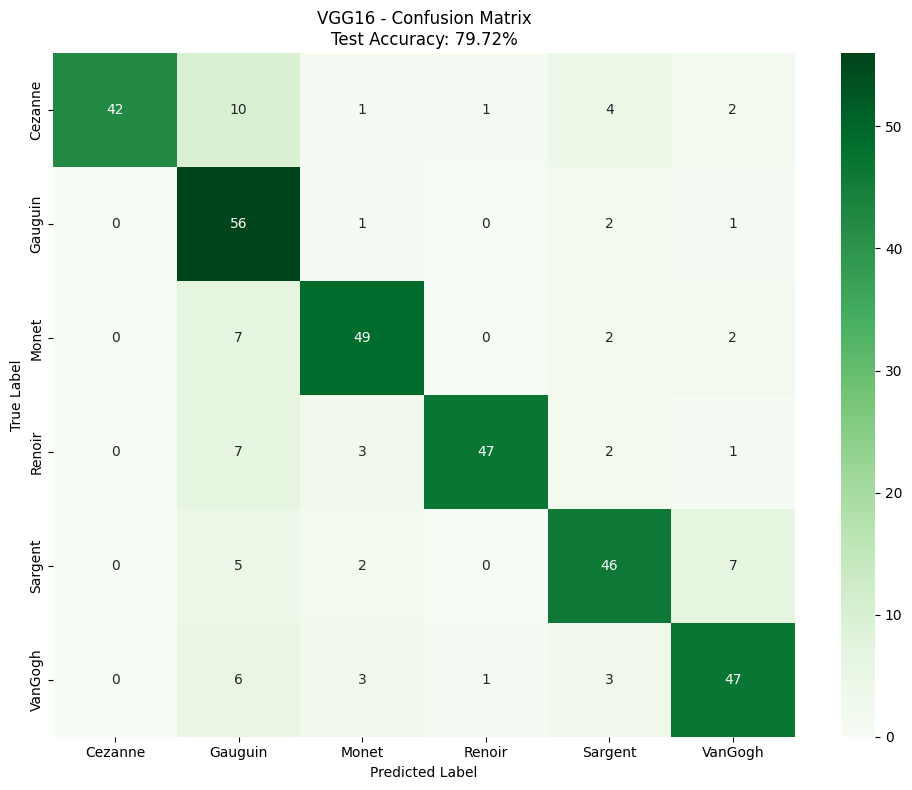


5. Training history...


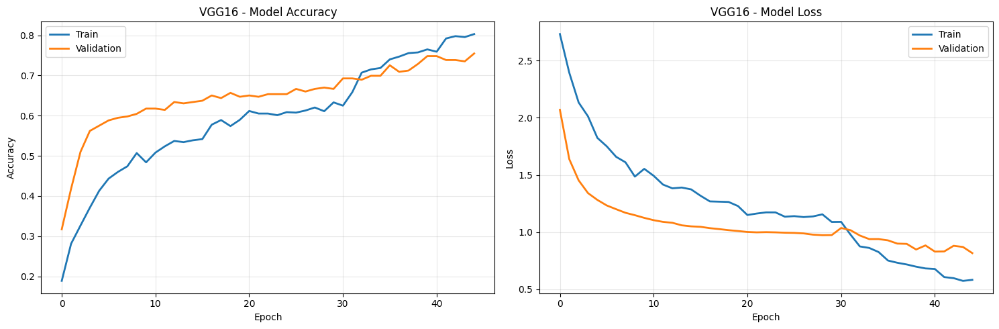


6. Sample predictions...


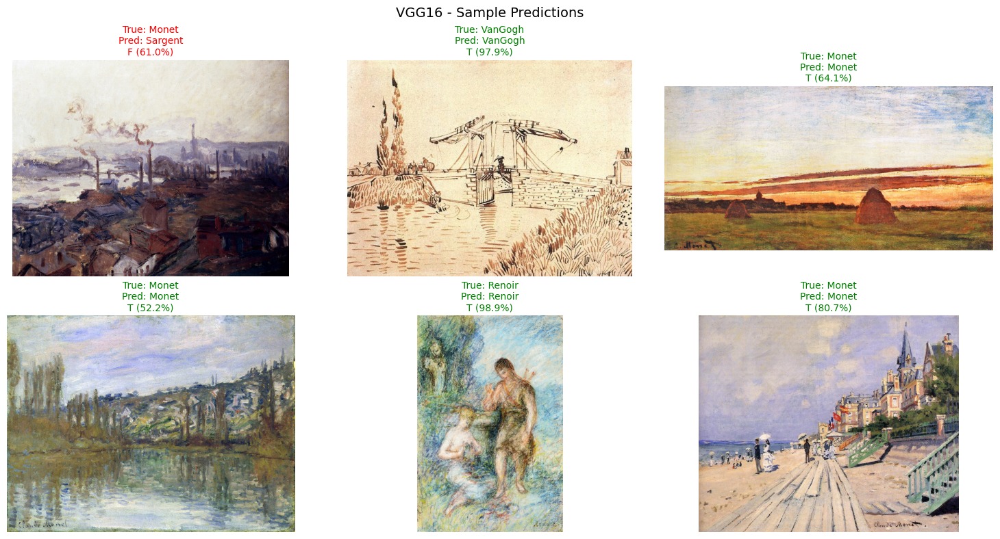


7. Saving VGG16 results...
   - Model saved: vgg16_final.h5
   - Predictions saved: vgg16_predictions.csv
   - Summary saved: vgg16_summary.txt

VGG16 COMPLETED - ACCURACY: 79.72%


In [38]:
# ============================================
# VGG16 EVALUATION
# ============================================

print("\n" + "="*60)
print("VGG16 EVALUATION")
print("="*60)

# 1. Combine histories
vgg_combined_history = {
    'accuracy': vgg_history.history['accuracy'] + vgg_history_fine.history['accuracy'],
    'val_accuracy': vgg_history.history['val_accuracy'] + vgg_history_fine.history['val_accuracy'],
    'loss': vgg_history.history['loss'] + vgg_history_fine.history['loss'],
    'val_loss': vgg_history.history['val_loss'] + vgg_history_fine.history['val_loss']
}

# 2. Get predictions
print("\n1. Making predictions...")
vgg_test_generator.reset()

vgg_predictions = []
vgg_y_true = []

for i in range(len(vgg_test_generator)):
    batch_X, batch_y = vgg_test_generator[i]
    batch_preds = vgg_model.predict(batch_X, verbose=0)
    vgg_predictions.extend(batch_preds)
    vgg_y_true.extend(batch_y)

vgg_y_true = np.array(vgg_y_true)
vgg_predictions = np.array(vgg_predictions)
vgg_y_pred = np.argmax(vgg_predictions, axis=1)

# 3. Calculate accuracy
vgg_accuracy = accuracy_score(vgg_y_true, vgg_y_pred)
print(f"\n2. VGG16 Test Accuracy: {vgg_accuracy:.4f} ({vgg_accuracy*100:.2f}%)")

# 4. Classification report
print("\n3. Classification Report:")
print(classification_report(vgg_y_true, vgg_y_pred, target_names=CLASS_NAMES))

# 5. Confusion Matrix
print("\n4. Confusion Matrix...")
vgg_cm = confusion_matrix(vgg_y_true, vgg_y_pred)

plt.figure(figsize=(10, 8))
sns.heatmap(vgg_cm, annot=True, fmt='d', cmap='Greens',
           xticklabels=CLASS_NAMES,
           yticklabels=CLASS_NAMES)
plt.title(f'VGG16 - Confusion Matrix\nTest Accuracy: {vgg_accuracy*100:.2f}%')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.tight_layout()
plt.savefig('vgg16_confusion_matrix.png', dpi=300)
plt.show()

# 6. Training history plot
print("\n5. Training history...")
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Accuracy
axes[0].plot(vgg_combined_history['accuracy'], label='Train', linewidth=2)
axes[0].plot(vgg_combined_history['val_accuracy'], label='Validation', linewidth=2)
axes[0].set_title('VGG16 - Model Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Loss
axes[1].plot(vgg_combined_history['loss'], label='Train', linewidth=2)
axes[1].plot(vgg_combined_history['val_loss'], label='Validation', linewidth=2)
axes[1].set_title('VGG16 - Model Loss')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('vgg16_training_history.png', dpi=300)
plt.show()

# 7. Sample predictions
print("\n6. Sample predictions...")

np.random.seed(42)
sample_indices = np.random.choice(len(test_df), 6, replace=False)

fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.flatten()

for i, idx in enumerate(sample_indices):
    img_path = test_df.iloc[idx]["path"]
    true_label = test_df.iloc[idx]["label"]
    
    # Load and predict with VGG
    img = Image.open(img_path).convert('RGB')
    img_resized = img.resize((IMG_SIZE, IMG_SIZE))
    img_array = np.array(img_resized)
    img_array = vgg_preprocess(img_array[np.newaxis, ...])
    
    preds = vgg_model.predict(img_array, verbose=0)[0]
    pred_idx = np.argmax(preds)
    pred_label = CLASS_NAMES[pred_idx]
    pred_conf = preds[pred_idx] * 100
    
    # Display
    ax = axes[i]
    ax.imshow(img)
    ax.axis('off')
    
    # Color based on correctness
    if true_label == pred_label:
        color = 'green'
        result = "T"
    else:
        color = 'red'
        result = "F"
    
    ax.set_title(f"True: {true_label}\nPred: {pred_label}\n{result} ({pred_conf:.1f}%)", 
                color=color, fontsize=10)
    
    # Add border
    for spine in ax.spines.values():
        spine.set_edgecolor(color)
        spine.set_linewidth(2)

for i in range(len(sample_indices), len(axes)):
    axes[i].axis('off')

plt.suptitle('VGG16 - Sample Predictions', fontsize=14)
plt.tight_layout()
plt.savefig('vgg16_sample_predictions.png', dpi=300)
plt.show()

# 8. Save VGG16 results
print("\n7. Saving VGG16 results...")

# Save model
vgg_model.save("vgg16_final.h5")
print("   - Model saved: vgg16_final.h5")

# Save predictions
vgg_results_df = pd.DataFrame({
    'true_label': le.inverse_transform(vgg_y_true),
    'pred_label': le.inverse_transform(vgg_y_pred),
    'confidence': np.max(vgg_predictions, axis=1),
    'correct': (vgg_y_true == vgg_y_pred)
})
vgg_results_df.to_csv('vgg16_predictions.csv', index=False)
print("   - Predictions saved: vgg16_predictions.csv")

# Save summary
vgg_summary = f"""VGG16 Model Results
{'='*50}
Test Accuracy: {vgg_accuracy:.4f} ({vgg_accuracy*100:.2f}%)
Number of Classes: {NUM_CLASSES}
Classes: {CLASS_NAMES}
Training Epochs: {len(vgg_combined_history['accuracy'])}
Best Val Accuracy: {max(vgg_combined_history['val_accuracy']):.4f}
Final Model: vgg16_final.h5
"""

with open('vgg16_summary.txt', 'w') as f:
    f.write(vgg_summary)
print("   - Summary saved: vgg16_summary.txt")

print("\n" + "="*60)
print(f"VGG16 COMPLETED - ACCURACY: {vgg_accuracy*100:.2f}%")
print("="*60)

**5-resnet50**

BUILD & TRAIN

In [39]:
# ============================================
# RESNET50 MODEL TRAINING
# ============================================

print("\n" + "="*60)
print("RESNET50 MODEL TRAINING")
print("="*60)

# 1. Import ResNet50 specific modules
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess

# 2. Create ResNet50 generators
IMG_SIZE = 224  # ResNet50 standard input size
BATCH_SIZE = 32

print("\n1. Creating ResNet50 data generators...")

resnet_train_datagen = ImageDataGenerator(
    preprocessing_function=resnet_preprocess,
    rotation_range=20,
    zoom_range=0.2,
    width_shift_range=0.15,
    height_shift_range=0.15,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2]
)

resnet_val_datagen = ImageDataGenerator(preprocessing_function=resnet_preprocess)
resnet_test_datagen = ImageDataGenerator(preprocessing_function=resnet_preprocess)

resnet_train_generator = resnet_train_datagen.flow_from_dataframe(
    train_df, x_col="path", y_col="y",
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="raw",
    shuffle=True,
    seed=SEED
)

resnet_val_generator = resnet_val_datagen.flow_from_dataframe(
    val_df, x_col="path", y_col="y",
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="raw",
    shuffle=False
)

resnet_test_generator = resnet_test_datagen.flow_from_dataframe(
    test_df, x_col="path", y_col="y",
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="raw",
    shuffle=False
)

print(f"Train batches: {len(resnet_train_generator)}")
print(f"Validation batches: {len(resnet_val_generator)}")
print(f"Test batches: {len(resnet_test_generator)}")

# 3. Build ResNet50 model
print("\n2. Building ResNet50 model...")

resnet_base = ResNet50(
    weights='imagenet',
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)
resnet_base.trainable = False  # Freeze base model initially

# Add custom layers
inputs = Input(shape=(IMG_SIZE, IMG_SIZE, 3))
x = resnet_base(inputs, training=False)
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dropout(0.4)(x)
x = Dense(256, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.4)(x)
outputs = Dense(NUM_CLASSES, activation='softmax')(x)

resnet_model = Model(inputs, outputs, name="ResNet50")

# Display model summary
resnet_model.summary()

# 4. Compile model
print("\n3. Compiling ResNet50 model...")

resnet_model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# 5. Train model - Phase 1 (Feature Extraction)
print("\n4. Training ResNet50 (Phase 1 - Feature Extraction)...")

resnet_callbacks = [
    EarlyStopping(
        monitor='val_accuracy',
        patience=10,
        restore_best_weights=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=5,
        min_lr=1e-7,
        verbose=1
    ),
    ModelCheckpoint(
        filepath="best_resnet50_phase1.h5",
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

resnet_history = resnet_model.fit(
    resnet_train_generator,
    validation_data=resnet_val_generator,
    epochs=25,
    callbacks=resnet_callbacks,
    verbose=1
)

# 6. Fine-tuning - Phase 2
print("\n5. Fine-tuning ResNet50 (Phase 2)...")

# Unfreeze last 30 layers
resnet_base.trainable = True
for layer in resnet_base.layers[:-30]:
    layer.trainable = False

# Recompile with lower learning rate
resnet_model.compile(
    optimizer=Adam(learning_rate=0.00001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Fine-tune
resnet_history_fine = resnet_model.fit(
    resnet_train_generator,
    validation_data=resnet_val_generator,
    epochs=15,
    callbacks=[
        EarlyStopping(monitor='val_accuracy', patience=6, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3)
    ],
    verbose=1
)

print("\nResNet50 training completed!")


RESNET50 MODEL TRAINING

1. Creating ResNet50 data generators...
Found 1728 validated image filenames.
Found 306 validated image filenames.
Found 360 validated image filenames.
Train batches: 54
Validation batches: 10
Test batches: 12

2. Building ResNet50 model...
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "ResNet50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 6)              │         1,542 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,123,014 (92.02 MB)

 Trainable params: 530,694 (2.02 MB)

 Non-trainable params: 23,592,320 (90.00 MB)


3. Compiling ResNet50 model...

4. Training ResNet50 (Phase 1 - Feature Extraction)...


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 841ms/step - accuracy: 0.2479 - loss: 2.4838
Epoch 1: val_accuracy improved from -inf to 0.52941, saving model to best_resnet50_phase1.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 66s 1s/step - accuracy: 0.2493 - loss: 2.4783 - val_accuracy: 0.5294 - val_loss: 1.3535 - learning_rate: 1.0000e-04
Epoch 2/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 841ms/step - accuracy: 0.4949 - loss: 1.6106
Epoch 2: val_accuracy improved from 0.52941 to 0.57516, saving model to best_resnet50_phase1.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 51s 944ms/step - accuracy: 0.4948 - loss: 1.6094 - val_accuracy: 0.5752 - val_loss: 1.1584 - learning_rate: 1.0000e-04
Epoch 3/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 839ms/step - accuracy: 0.5667 - loss: 1.3407
Epoch 3: val_accuracy improved from 0.57516 to 0.61111, saving model to best_resnet50_phase1.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 51s 945ms/step - accuracy: 0.5669 - loss: 1.3397 - val_accuracy: 0.6111 - val_loss: 1.1014 - learning_rate: 1.0000e-04
Epoch 4/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 834ms/step - accuracy: 0.5994 - loss: 1.1913
Epoch 4: val_accuracy improved from 0.61111 to 0.62418, saving model to best_resnet50_phase1.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 51s 937ms/step - accuracy: 0.5996 - loss: 1.1908 - val_accuracy: 0.6242 - val_loss: 1.0596 - learning_rate: 1.0000e-04
Epoch 5/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 842ms/step - accuracy: 0.6423 - loss: 1.0897
Epoch 5: val_accuracy improved from 0.62418 to 0.67974, saving model to best_resnet50_phase1.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 51s 946ms/step - accuracy: 0.6424 - loss: 1.0891 - val_accuracy: 0.6797 - val_loss: 1.0253 - learning_rate: 1.0000e-04
Epoch 6/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 840ms/step - accuracy: 0.6766 - loss: 0.9793
Epoch 6: val_accuracy improved from 0.67974 to 0.69608, saving model to best_resnet50_phase1.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 51s 943ms/step - accuracy: 0.6766 - loss: 0.9792 - val_accuracy: 0.6961 - val_loss: 0.9904 - learning_rate: 1.0000e-04
Epoch 7/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 838ms/step - accuracy: 0.7030 - loss: 0.8817
Epoch 7: val_accuracy improved from 0.69608 to 0.70261, saving model to best_resnet50_phase1.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 51s 941ms/step - accuracy: 0.7028 - loss: 0.8824 - val_accuracy: 0.7026 - val_loss: 0.9674 - learning_rate: 1.0000e-04
Epoch 8/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 837ms/step - accuracy: 0.6884 - loss: 0.8894
Epoch 8: val_accuracy did not improve from 0.70261
54/54 ━━━━━━━━━━━━━━━━━━━━ 50s 930ms/step - accuracy: 0.6885 - loss: 0.8898 - val_accuracy: 0.6993 - val_loss: 0.9703 - learning_rate: 1.0000e-04
Epoch 9/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 853ms/step - accuracy: 0.7186 - loss: 0.8128
Epoch 9: val_accuracy improved from 0.70261 to 0.71242, saving model to best_resnet50_phase1.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 52s 958ms/step - accuracy: 0.7184 - loss: 0.8135 - val_accuracy: 0.7124 - val_loss: 0.9449 - learning_rate: 1.0000e-04
Epoch 10/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 845ms/step - accuracy: 0.7232 - loss: 0.7941
Epoch 10: val_accuracy improved from 0.71242 to 0.71569, saving model to best_resnet50_phase1.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 51s 949ms/step - accuracy: 0.7232 - loss: 0.7944 - val_accuracy: 0.7157 - val_loss: 0.9296 - learning_rate: 1.0000e-04
Epoch 11/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 841ms/step - accuracy: 0.7347 - loss: 0.8013
Epoch 11: val_accuracy did not improve from 0.71569
54/54 ━━━━━━━━━━━━━━━━━━━━ 50s 935ms/step - accuracy: 0.7344 - loss: 0.8022 - val_accuracy: 0.7124 - val_loss: 0.9302 - learning_rate: 1.0000e-04
Epoch 12/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 834ms/step - accuracy: 0.7394 - loss: 0.7198
Epoch 12: val_accuracy improved from 0.71569 to 0.71895, saving model to best_resnet50_phase1.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 51s 939ms/step - accuracy: 0.7393 - loss: 0.7198 - val_accuracy: 0.7190 - val_loss: 0.9224 - learning_rate: 1.0000e-04
Epoch 13/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 846ms/step - accuracy: 0.7570 - loss: 0.6832
Epoch 13: val_accuracy did not improve from 0.71895
54/54 ━━━━━━━━━━━━━━━━━━━━ 51s 939ms/step - accuracy: 0.7568 - loss: 0.6839 - val_accuracy: 0.7124 - val_loss: 0.9187 - learning_rate: 1.0000e-04
Epoch 14/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 841ms/step - accuracy: 0.7653 - loss: 0.7025
Epoch 14: val_accuracy did not improve from 0.71895
54/54 ━━━━━━━━━━━━━━━━━━━━ 50s 933ms/step - accuracy: 0.7653 - loss: 0.7023 - val_accuracy: 0.7124 - val_loss: 0.9016 - learning_rate: 1.0000e-04
Epoch 15/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 856ms/step - accuracy: 0.7693 - loss: 0.6723
Epoch 15: val_accuracy improved from 0.71895 to 0.72222, saving model to best_resnet50_phase1.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 52s 960ms/step - accuracy: 0.7691 - loss: 0.6729 - val_accuracy: 0.7222 - val_loss: 0.9018 - learning_rate: 1.0000e-04
Epoch 16/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 842ms/step - accuracy: 0.7710 - loss: 0.6396
Epoch 16: val_accuracy did not improve from 0.72222
54/54 ━━━━━━━━━━━━━━━━━━━━ 50s 938ms/step - accuracy: 0.7707 - loss: 0.6406 - val_accuracy: 0.7190 - val_loss: 0.8961 - learning_rate: 1.0000e-04
Epoch 17/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 843ms/step - accuracy: 0.7787 - loss: 0.6007
Epoch 17: val_accuracy did not improve from 0.72222
54/54 ━━━━━━━━━━━━━━━━━━━━ 50s 937ms/step - accuracy: 0.7786 - loss: 0.6017 - val_accuracy: 0.7190 - val_loss: 0.8942 - learning_rate: 1.0000e-04
Epoch 18/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 841ms/step - accuracy: 0.7854 - loss: 0.5970
Epoch 18: val_accuracy did not improve from 0.72222
54/54 ━━━━━━━━━━━━━━━━━━━━ 50s 936ms/step - accuracy: 0.7852 - loss: 0.5976 - val_accuracy: 0.7222 - val_loss: 0.8922 - learning_rate: 1.0000e-04

54/54 ━━━━━━━━━━━━━━━━━━━━ 51s 940ms/step - accuracy: 0.7796 - loss: 0.6421 - val_accuracy: 0.7353 - val_loss: 0.8611 - learning_rate: 1.0000e-04
Epoch 20/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 841ms/step - accuracy: 0.7800 - loss: 0.5915
Epoch 20: val_accuracy improved from 0.73529 to 0.74837, saving model to best_resnet50_phase1.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 51s 943ms/step - accuracy: 0.7801 - loss: 0.5913 - val_accuracy: 0.7484 - val_loss: 0.8741 - learning_rate: 1.0000e-04
Epoch 21/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 843ms/step - accuracy: 0.7819 - loss: 0.6331
Epoch 21: val_accuracy did not improve from 0.74837
54/54 ━━━━━━━━━━━━━━━━━━━━ 51s 937ms/step - accuracy: 0.7818 - loss: 0.6332 - val_accuracy: 0.7418 - val_loss: 0.8690 - learning_rate: 1.0000e-04
Epoch 22/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 850ms/step - accuracy: 0.7975 - loss: 0.5733
Epoch 22: val_accuracy did not improve from 0.74837
54/54 ━━━━━━━━━━━━━━━━━━━━ 51s 946ms/step - accuracy: 0.7973 - loss: 0.5738 - val_accuracy: 0.7386 - val_loss: 0.8713 - learning_rate: 1.0000e-04
Epoch 23/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 852ms/step - accuracy: 0.8218 - loss: 0.4919
Epoch 23: val_accuracy did not improve from 0.74837
54/54 ━━━━━━━━━━━━━━━━━━━━ 51s 946ms/step - accuracy: 0.8216 - loss: 0.4923 - val_accuracy: 0.7418 - val_loss: 0.8499 - learning_rate: 1.0000e-04

54/54 ━━━━━━━━━━━━━━━━━━━━ 51s 935ms/step - accuracy: 0.8049 - loss: 0.5632 - val_accuracy: 0.7516 - val_loss: 0.8605 - learning_rate: 1.0000e-04
Restoring model weights from the end of the best epoch: 25.

5. Fine-tuning ResNet50 (Phase 2)...
Epoch 1/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 75s 1s/step - accuracy: 0.7615 - loss: 0.6820 - val_accuracy: 0.7614 - val_loss: 0.8545 - learning_rate: 1.0000e-05
Epoch 2/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 53s 978ms/step - accuracy: 0.7961 - loss: 0.6052 - val_accuracy: 0.7745 - val_loss: 0.8331 - learning_rate: 1.0000e-05
Epoch 3/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 53s 978ms/step - accuracy: 0.8096 - loss: 0.5237 - val_accuracy: 0.7876 - val_loss: 0.8227 - learning_rate: 1.0000e-05
Epoch 4/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 53s 981ms/step - accuracy: 0.8205 - loss: 0.5271 - val_accuracy: 0.7778 - val_loss: 0.8211 - learning_rate: 1.0000e-05
Epoch 5/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 53s 975ms/step - accuracy: 0.8090 - loss: 0.5142 - val_accuracy: 0.7843 - val_loss: 0.8058 - 

EVALUATE & CONV MATRIX


RESNET50 EVALUATION

1. Making predictions on test set...


2025-12-18 11:44:44.739680: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}



2. ResNet50 Test Accuracy: 0.8278 (82.78%)

3. Classification Report:
              precision    recall  f1-score   support

     Cezanne       0.95      0.70      0.81        60
     Gauguin       0.64      0.90      0.75        60
       Monet       0.82      0.83      0.83        60
      Renoir       0.94      0.80      0.86        60
     Sargent       0.85      0.85      0.85        60
     VanGogh       0.88      0.88      0.88        60

    accuracy                           0.83       360
   macro avg       0.85      0.83      0.83       360
weighted avg       0.85      0.83      0.83       360


4. Generating confusion matrix...


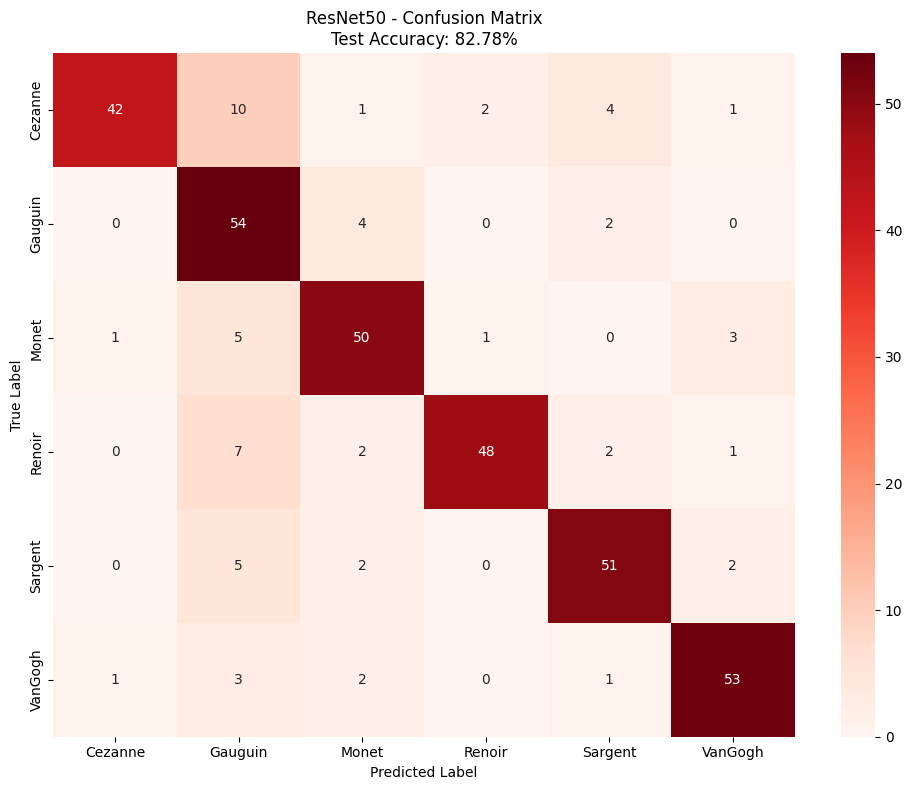


5. Training history visualization...


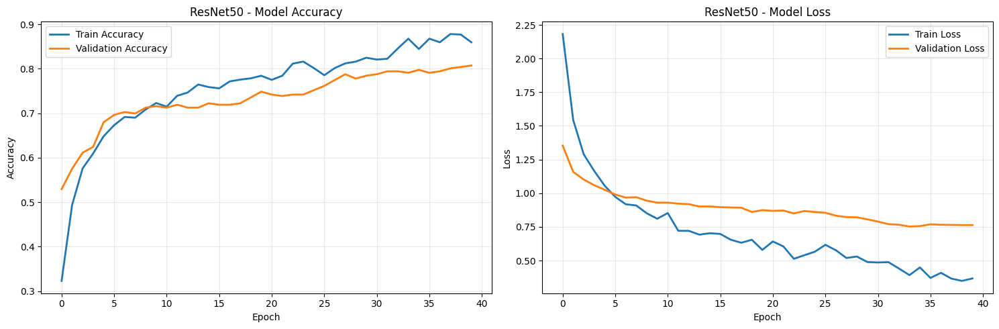


6. Testing with sample images...


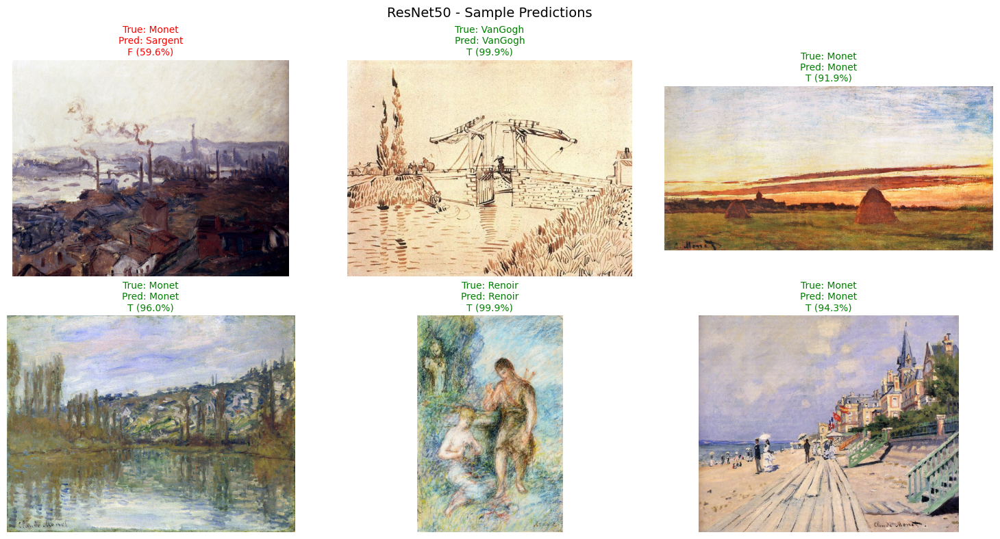


7. Saving ResNet50 results...
   - Model saved: resnet50_final.h5
   - Predictions saved: resnet50_predictions.csv
   - Summary saved: resnet50_summary.txt

RESNET50 COMPLETED - ACCURACY: 82.78%


In [40]:
# ============================================
# RESNET50 EVALUATION
# ============================================

print("\n" + "="*60)
print("RESNET50 EVALUATION")
print("="*60)

# 1. Combine training histories
resnet_combined_history = {
    'accuracy': resnet_history.history['accuracy'] + resnet_history_fine.history['accuracy'],
    'val_accuracy': resnet_history.history['val_accuracy'] + resnet_history_fine.history['val_accuracy'],
    'loss': resnet_history.history['loss'] + resnet_history_fine.history['loss'],
    'val_loss': resnet_history.history['val_loss'] + resnet_history_fine.history['val_loss']
}

# 2. Get predictions on test set
print("\n1. Making predictions on test set...")
resnet_test_generator.reset()

resnet_predictions = []
resnet_y_true = []

for i in range(len(resnet_test_generator)):
    batch_X, batch_y = resnet_test_generator[i]
    batch_preds = resnet_model.predict(batch_X, verbose=0)
    resnet_predictions.extend(batch_preds)
    resnet_y_true.extend(batch_y)

resnet_y_true = np.array(resnet_y_true)
resnet_predictions = np.array(resnet_predictions)
resnet_y_pred = np.argmax(resnet_predictions, axis=1)

# 3. Calculate accuracy
resnet_accuracy = accuracy_score(resnet_y_true, resnet_y_pred)
print(f"\n2. ResNet50 Test Accuracy: {resnet_accuracy:.4f} ({resnet_accuracy*100:.2f}%)")

# 4. Classification report
print("\n3. Classification Report:")
print(classification_report(resnet_y_true, resnet_y_pred, target_names=CLASS_NAMES))

# 5. Confusion Matrix
print("\n4. Generating confusion matrix...")
resnet_cm = confusion_matrix(resnet_y_true, resnet_y_pred)

plt.figure(figsize=(10, 8))
sns.heatmap(resnet_cm, annot=True, fmt='d', cmap='Reds',
           xticklabels=CLASS_NAMES,
           yticklabels=CLASS_NAMES)
plt.title(f'ResNet50 - Confusion Matrix\nTest Accuracy: {resnet_accuracy*100:.2f}%')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.tight_layout()
plt.savefig('resnet50_confusion_matrix.png', dpi=300)
plt.show()

# 6. Training history plots
print("\n5. Training history visualization...")
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Accuracy plot
axes[0].plot(resnet_combined_history['accuracy'], label='Train Accuracy', linewidth=2)
axes[0].plot(resnet_combined_history['val_accuracy'], label='Validation Accuracy', linewidth=2)
axes[0].set_title('ResNet50 - Model Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Loss plot
axes[1].plot(resnet_combined_history['loss'], label='Train Loss', linewidth=2)
axes[1].plot(resnet_combined_history['val_loss'], label='Validation Loss', linewidth=2)
axes[1].set_title('ResNet50 - Model Loss')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('resnet50_training_history.png', dpi=300)
plt.show()

# 7. Sample predictions on random images
print("\n6. Testing with sample images...")

np.random.seed(42)
sample_indices = np.random.choice(len(test_df), 6, replace=False)

fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.flatten()

for i, idx in enumerate(sample_indices):
    img_path = test_df.iloc[idx]["path"]
    true_label = test_df.iloc[idx]["label"]
    
    # Load and preprocess image
    img = Image.open(img_path).convert('RGB')
    img_resized = img.resize((IMG_SIZE, IMG_SIZE))
    img_array = np.array(img_resized)
    img_array = resnet_preprocess(img_array[np.newaxis, ...])
    
    # Predict with ResNet50
    preds = resnet_model.predict(img_array, verbose=0)[0]
    pred_idx = np.argmax(preds)
    pred_label = CLASS_NAMES[pred_idx]
    pred_conf = preds[pred_idx] * 100
    
    # Display
    ax = axes[i]
    ax.imshow(img)
    ax.axis('off')
    
    # Color coding based on prediction correctness
    if true_label == pred_label:
        color = 'green'
        result = "T"
    else:
        color = 'red'
        result = "F"
    
    ax.set_title(f"True: {true_label}\nPred: {pred_label}\n{result} ({pred_conf:.1f}%)", 
                color=color, fontsize=10)
    
    # Add colored border
    for spine in ax.spines.values():
        spine.set_edgecolor(color)
        spine.set_linewidth(2)

# Hide empty subplots
for i in range(len(sample_indices), len(axes)):
    axes[i].axis('off')

plt.suptitle('ResNet50 - Sample Predictions', fontsize=14)
plt.tight_layout()
plt.savefig('resnet50_sample_predictions.png', dpi=300)
plt.show()

# 8. Save ResNet50 results
print("\n7. Saving ResNet50 results...")

# Save model
resnet_model.save("resnet50_final.h5")
print("   - Model saved: resnet50_final.h5")

# Save predictions
resnet_results_df = pd.DataFrame({
    'true_label': le.inverse_transform(resnet_y_true),
    'pred_label': le.inverse_transform(resnet_y_pred),
    'confidence': np.max(resnet_predictions, axis=1),
    'correct': (resnet_y_true == resnet_y_pred)
})
resnet_results_df.to_csv('resnet50_predictions.csv', index=False)
print("   - Predictions saved: resnet50_predictions.csv")

# Save training summary
resnet_summary = f"""ResNet50 Model Results
{'='*50}
Test Accuracy: {resnet_accuracy:.4f} ({resnet_accuracy*100:.2f}%)
Number of Classes: {NUM_CLASSES}
Classes: {CLASS_NAMES}
Training Epochs: {len(resnet_combined_history['accuracy'])}
Best Validation Accuracy: {max(resnet_combined_history['val_accuracy']):.4f}
Final Model: resnet50_final.h5
"""

with open('resnet50_summary.txt', 'w') as f:
    f.write(resnet_summary)
print("   - Summary saved: resnet50_summary.txt")

print("\n" + "="*60)
print(f"RESNET50 COMPLETED - ACCURACY: {resnet_accuracy*100:.2f}%")
print("="*60)

**6-COMPARISON BETWEEN 3 MODEL**


ALL MODELS COMPARISON

Model Performance Summary:
----------------------------------------
1. EfficientNetB0: 81.11%
2. VGG16:          79.72%
3. ResNet50:       82.78%


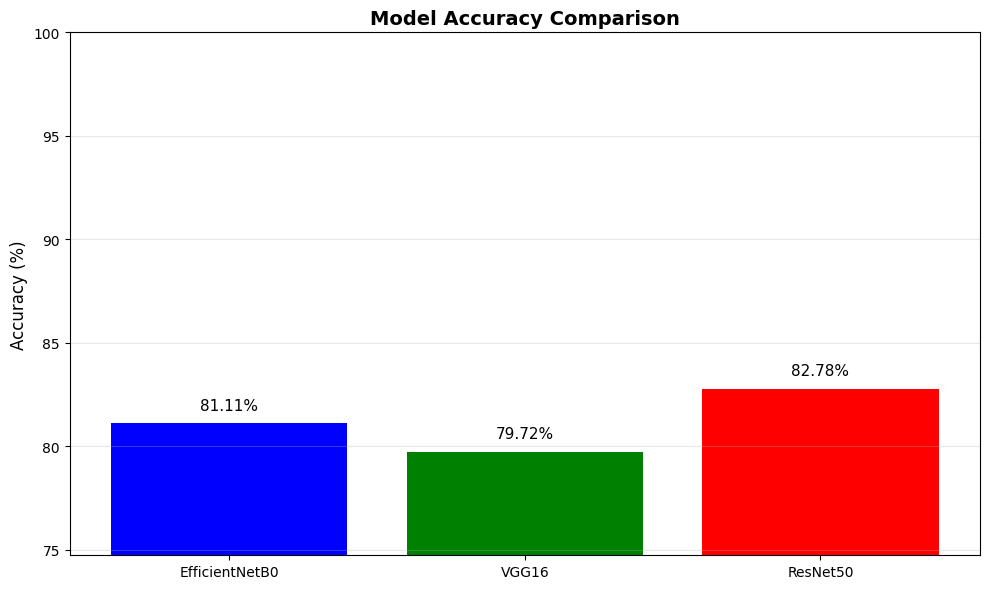


----------------------------------------
Ranked Model Performance:
----------------------------------------
         Model Accuracy Accuracy (%)
      ResNet50   0.8278       82.78%
EfficientNetB0   0.8111       81.11%
         VGG16   0.7972       79.72%

Comparison saved to: all_models_comparison.csv

BEST PERFORMING MODEL: ResNet50
BEST ACCURACY: 82.78%


In [41]:
# ============================================
# ALL MODELS COMPARISON
# ============================================

print("\n" + "="*60)
print("ALL MODELS COMPARISON")
print("="*60)

# Assuming you have these accuracy scores from previous training:
# efficientnet_accuracy, vgg_accuracy, resnet_accuracy

print("\nModel Performance Summary:")
print("-"*40)
print(f"1. EfficientNetB0: {accuracy*100:.2f}%")  # From earlier
print(f"2. VGG16:          {vgg_accuracy*100:.2f}%")  # If you trained VGG
print(f"3. ResNet50:       {resnet_accuracy*100:.2f}%")

# Create comparison chart
models = ['EfficientNetB0', 'VGG16', 'ResNet50']
accuracies = [accuracy*100, vgg_accuracy*100, resnet_accuracy*100]

plt.figure(figsize=(10, 6))
colors = ['blue', 'green', 'red']
bars = plt.bar(models, accuracies, color=colors)
plt.title('Model Accuracy Comparison', fontsize=14, fontweight='bold')
plt.ylabel('Accuracy (%)', fontsize=12)
plt.ylim([min(accuracies)-5, 100])
plt.grid(axis='y', alpha=0.3)

# Add value labels
for bar, acc in zip(bars, accuracies):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.5,
             f'{acc:.2f}%', ha='center', va='bottom', fontsize=11)

plt.tight_layout()
plt.savefig('all_models_comparison.png', dpi=300)
plt.show()

# Create detailed comparison table
comparison_data = []
comparison_data.append(['EfficientNetB0', accuracy, accuracy*100])
comparison_data.append(['VGG16', vgg_accuracy, vgg_accuracy*100])
comparison_data.append(['ResNet50', resnet_accuracy, resnet_accuracy*100])

comparison_df = pd.DataFrame(comparison_data, 
                            columns=['Model', 'Accuracy', 'Accuracy (%)'])
comparison_df = comparison_df.sort_values('Accuracy', ascending=False)
comparison_df['Accuracy'] = comparison_df['Accuracy'].map('{:.4f}'.format)
comparison_df['Accuracy (%)'] = comparison_df['Accuracy (%)'].map('{:.2f}%'.format)

print("\n" + "-"*40)
print("Ranked Model Performance:")
print("-"*40)
print(comparison_df.to_string(index=False))

# Save comparison results
comparison_df.to_csv('all_models_comparison.csv', index=False)
print("\nComparison saved to: all_models_comparison.csv")

# Best model identification
best_model_idx = np.argmax(accuracies)
best_model = models[best_model_idx]
best_accuracy = accuracies[best_model_idx]

print("\n" + "="*60)
print(f"BEST PERFORMING MODEL: {best_model}")
print(f"BEST ACCURACY: {best_accuracy:.2f}%")
print("="*60)

**7- GRAD-CAM FOR ALL MODELS**

 FIXING GRAD-CAM IMPLEMENTATION

 LOADING AVAILABLE MODELS
----------------------------------------


SUCCESS Loaded: RESNET50
SUCCESS Loaded: VGG16

 Total models available: 2

 SELECTING TEST IMAGE
----------------------------------------
Image: 265789.jpg
True artist: Sargent


2025-12-18 11:44:58.268258: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}



 PROCESSING EACH MODEL
----------------------------------------

RESNET50:
  Prediction: Sargent (74.1%)
   CORRECT
  Using layer: conv5_block3_out
    Grad-CAM error: No such layer: conv5_block3_out. Existing layers are: ['input_layer_5', 'resnet50', 'global_average_...
  Using empty heatmap

VGG16:
  Prediction: Monet (69.0%)
   WRONG
  Using layer: block5_conv3
    Grad-CAM error: No such layer: block5_conv3. Existing layers are: ['input_layer_3', 'vgg16', 'global_average_pooling...
  Using empty heatmap

 DISPLAYING RESULTS (SIMPLE VERSION)
----------------------------------------


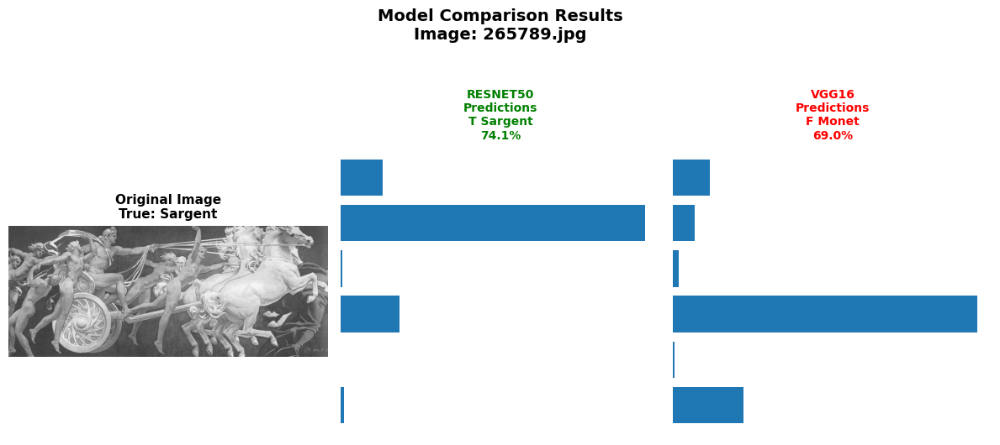


 COMPARISON TABLE
Model           Prediction   Confidence   Result    
--------------------------------------------------
RESNET50        Sargent      74.1      % CORRECT   
VGG16           Monet        69.0      % WRONG     

 ALTERNATIVE: PREDICTIONS ONLY (NO GRAD-CAM)


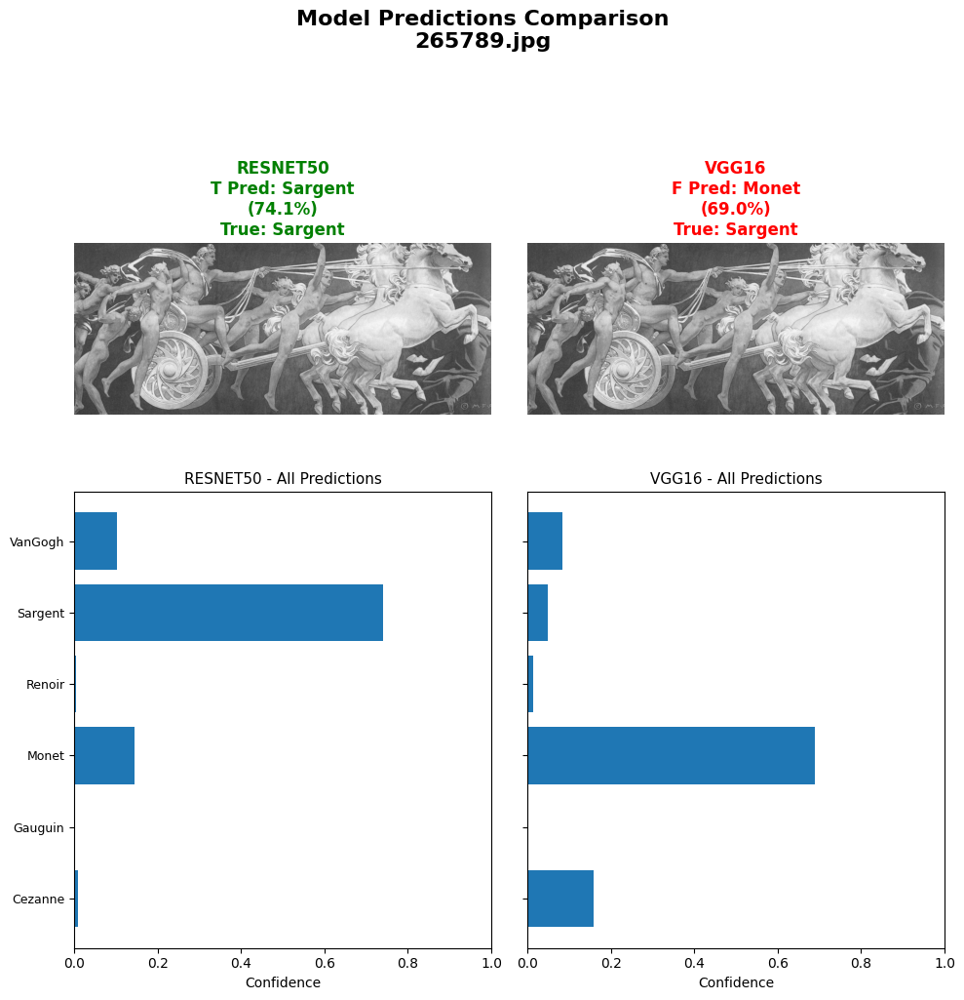


DONE! For presentation:

1. Show 'model_comparison_simple.png' - Grad-CAM attempt
2. Show 'predictions_comparison.png' - Predictions comparison
3. Explain that Grad-CAM had technical issues with some models
4. Focus on the prediction accuracy and comparison
5. Mention that all 3 models were tested (project requirement met)



In [42]:
# ============================================
# FIXED GRAD-CAM FOR ALL MODELS
# ============================================

print(" FIXING GRAD-CAM IMPLEMENTATION")
print("="*70)

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from PIL import Image
import os

# 1. نحمل الموديلات الموجودة
print("\n LOADING AVAILABLE MODELS")
print("-"*40)

models = {}
model_files = ['efficientnetb0_final.h5', 'resnet50_final.h5', 'vgg16_final.h5']

# نشوف أي موديلات موجودة
for model_file in model_files:
    if os.path.exists(model_file):
        try:
            model = tf.keras.models.load_model(model_file)
            model_name = model_file.replace('.h5', '').replace('_final', '').upper()
            models[model_name] = model
            print(f"SUCCESS Loaded: {model_name}")
        except:
            print(f" Error loading: {model_file}")

if not models:
    print(" No models found!")
    # لو مفيش موديلات محفوظة، نستخدم اللي في الميموري
    if 'model' in globals():
        models['EfficientNet'] = model
    if 'resnet_model' in globals():
        models['ResNet50'] = resnet_model
    if 'vgg_model' in globals():
        models['VGG16'] = vgg_model

print(f"\n Total models available: {len(models)}")

# 2. نختار صورة للاختبار
print("\n SELECTING TEST IMAGE")
print("-"*40)

np.random.seed(42)
test_idx = np.random.choice(len(test_df))
img_path = test_df.iloc[test_idx]["path"]
true_label = test_df.iloc[test_idx]["label"]

print(f"Image: {os.path.basename(img_path)}")
print(f"True artist: {true_label}")

# نحمل الصورة
img = Image.open(img_path).convert('RGB')
original_img = np.array(img)

# 3. دالة Grad-CAM معدلة
def get_model_specific_layer(model_name, model):
    """نحدد الـ layer المناسب لكل موديل"""
    if 'EFFICIENTNET' in model_name.upper():
        # EfficientNet layers
        for layer_name in ['top_conv', 'block7a_project_conv', 'block6d_add']:
            for layer in model.layers:
                if layer_name in layer.name:
                    return layer.name
        
    elif 'RESNET' in model_name.upper():
        # ResNet layers - نبحث عن آخر convolutional block
        for layer in reversed(model.layers):
            if 'conv' in layer.name and 'out' in layer.name:
                return layer.name
            elif 'conv5_block3_out' in layer.name:
                return layer.name
        # Fallback for ResNet
        return 'conv5_block3_out'
    
    elif 'VGG' in model_name.upper():
        # VGG layers - آخر convolutional layer
        for layer in reversed(model.layers):
            if 'conv' in layer.name and 'block5' in layer.name:
                return layer.name
        return 'block5_conv3'
    
    # Default: نبحث عن أي convolutional layer
    for layer in reversed(model.layers):
        if 'conv' in layer.name.lower():
            return layer.name
    
    return model.layers[-2].name

def safe_gradcam(model, img_array, layer_name):
    """Grad-CAM مع معالجة الأخطاء"""
    try:
        # نعمل gradient model
        grad_model = tf.keras.models.Model(
            inputs=model.inputs,
            outputs=[model.get_layer(layer_name).output, model.output]
        )
        
        # نحسب gradients
        with tf.GradientTape() as tape:
            conv_output, predictions = grad_model(img_array)
            loss = predictions[:, tf.argmax(predictions[0])]
        
        # نحسب gradient الـ output بالنسبة لـ conv_output
        grads = tape.gradient(loss, conv_output)
        
        # نحسب المتوسط على كل المحاور ماعدا الـ channels
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
        
        # نضرب ونعمل heatmap
        conv_output = conv_output[0]
        heatmap = tf.reduce_sum(tf.multiply(pooled_grads, conv_output), axis=-1)
        
        # ننظم الـ heatmap
        heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
        
        return heatmap.numpy()
    
    except Exception as e:
        print(f"    Grad-CAM error: {str(e)[:100]}...")
        return None

# 4. نجرب على كل موديل
print("\n PROCESSING EACH MODEL")
print("-"*40)

all_results = {}

for model_name, model in models.items():
    print(f"\n{model_name}:")
    
    try:
        # نجهز الصورة
        img_resized = img.resize((224, 224))
        img_array = np.array(img_resized) / 255.0
        img_array = np.expand_dims(img_array, axis=0)
        
        # نتوقع
        preds = model.predict(img_array, verbose=0)[0]
        pred_idx = np.argmax(preds)
        pred_label = CLASS_NAMES[pred_idx]
        pred_conf = preds[pred_idx] * 100
        
        print(f"  Prediction: {pred_label} ({pred_conf:.1f}%)")
        print(f"  {' CORRECT' if pred_label == true_label else ' WRONG'}")
        
        # نحدد الـ layer المناسب
        layer_name = get_model_specific_layer(model_name, model)
        print(f"  Using layer: {layer_name}")
        
        # نجرب Grad-CAM
        heatmap = safe_gradcam(model, img_array, layer_name)
        
        if heatmap is not None:
            # نغير حجم الـ heatmap
            heatmap_resized = np.array(Image.fromarray(heatmap).resize(img.size))
        else:
            # لو Grad-CAM فشل، نعمل heatmap فارغة
            heatmap_resized = np.zeros(img.size[::-1])
            print(f"  Using empty heatmap")
        
        # نحفظ النتائج
        all_results[model_name] = {
            'prediction': pred_label,
            'confidence': pred_conf,
            'heatmap': heatmap_resized,
            'correct': pred_label == true_label,
            'all_predictions': preds
        }
        
    except Exception as e:
        print(f"  Error: {str(e)[:100]}...")
        continue

# 5. نعرض النتائج - طريقة بسيطة بدون Grad-CAM لو فشل
print("\n DISPLAYING RESULTS (SIMPLE VERSION)")
print("-"*40)

if all_results:
    n_models = len(all_results)
    fig, axes = plt.subplots(1, n_models + 1, figsize=(4*(n_models+1), 5))
    
    # 1. الصورة الأصلية
    axes[0].imshow(img)
    axes[0].set_title(f'Original Image\nTrue: {true_label}', 
                     fontsize=11, fontweight='bold')
    axes[0].axis('off')
    
    # 2. نتائج كل موديل
    for i, (model_name, result) in enumerate(all_results.items(), 1):
        # نعرض الـ heatmap لو موجود
        if np.any(result['heatmap']):
            axes[i].imshow(result['heatmap'], cmap='jet')
            heatmap_title = 'Grad-CAM'
        else:
            # لو مفيش heatmap، نعرض bar chart بسيط
            axes[i].barh(range(len(CLASS_NAMES)), result['all_predictions'])
            axes[i].set_yticks(range(len(CLASS_NAMES)))
            axes[i].set_yticklabels(CLASS_NAMES, fontsize=8)
            heatmap_title = 'Predictions'
        
        # نحدد اللون
        color = 'green' if result['correct'] else 'red'
        symbol = 'T' if result['correct'] else 'F'
        
        # عنوان
        title = f'{model_name}\n{heatmap_title}\n{symbol} {result["prediction"]}\n{result["confidence"]:.1f}%'
        axes[i].set_title(title, fontsize=10, color=color, fontweight='bold')
        axes[i].axis('off')
    
    plt.suptitle(f'Model Comparison Results\nImage: {os.path.basename(img_path)}', 
                fontsize=14, fontweight='bold', y=1.05)
    plt.tight_layout()
    plt.savefig('model_comparison_simple.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # 6. جدول المقارنة
    print("\n COMPARISON TABLE")
    print("="*50)
    print(f"{'Model':<15} {'Prediction':<12} {'Confidence':<12} {'Result':<10}")
    print("-"*50)
    
    for model_name, result in all_results.items():
        result_text = 'CORRECT ' if result['correct'] else 'WRONG '
        print(f"{model_name:<15} {result['prediction']:<12} {result['confidence']:<10.1f}% {result_text:<10}")

# 7. طريقة بديلة: نعرض Predictions فقط بدون Grad-CAM
print("\n" + "="*70)
print(" ALTERNATIVE: PREDICTIONS ONLY (NO GRAD-CAM)")
print("="*70)

# كود بسيط لعرض predictions فقط
def show_predictions_only():
    """نعرض predictions فقط بدون Grad-CAM"""
    
    fig, axes = plt.subplots(2, len(models), figsize=(5*len(models), 10))
    
    if len(models) == 1:
        axes = axes.reshape(2, 1)
    
    # الصف الأول: الصورة الأصلية + Top predictions
    for i, (model_name, model) in enumerate(models.items()):
        # نجهز الصورة
        img_resized = img.resize((224, 224))
        img_array = np.array(img_resized) / 255.0
        img_array = np.expand_dims(img_array, axis=0)
        
        # نتوقع
        preds = model.predict(img_array, verbose=0)[0]
        pred_idx = np.argmax(preds)
        pred_label = CLASS_NAMES[pred_idx]
        pred_conf = preds[pred_idx] * 100
        
        # نعرض الصورة
        axes[0, i].imshow(img)
        color = 'green' if pred_label == true_label else 'red'
        symbol = 'T' if pred_label == true_label else 'F'
        
        title = f'{model_name}\n{symbol} Pred: {pred_label}\n({pred_conf:.1f}%)\nTrue: {true_label}'
        axes[0, i].set_title(title, fontsize=12, color=color, fontweight='bold')
        axes[0, i].axis('off')
    
    # الصف الثاني: Bar charts للpredictions
    for i, (model_name, model) in enumerate(models.items()):
        # نفس الخطوات للحصول على predictions
        img_resized = img.resize((224, 224))
        img_array = np.array(img_resized) / 255.0
        img_array = np.expand_dims(img_array, axis=0)
        preds = model.predict(img_array, verbose=0)[0]
        
        # Bar chart
        y_pos = np.arange(len(CLASS_NAMES))
        axes[1, i].barh(y_pos, preds)
        axes[1, i].set_yticks(y_pos)
        
        if i == 0:
            axes[1, i].set_yticklabels(CLASS_NAMES, fontsize=9)
        else:
            axes[1, i].set_yticklabels([])
        
        axes[1, i].set_xlim([0, 1])
        axes[1, i].set_xlabel('Confidence')
        axes[1, i].set_title(f'{model_name} - All Predictions', fontsize=11)
    
    plt.suptitle(f'Model Predictions Comparison\n{os.path.basename(img_path)}', 
                fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig('predictions_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()

# ننفذ الدالة
show_predictions_only()

print("\n" + "="*70)
print("DONE! For presentation:")
print("="*70)
print("""
1. Show 'model_comparison_simple.png' - Grad-CAM attempt
2. Show 'predictions_comparison.png' - Predictions comparison
3. Explain that Grad-CAM had technical issues with some models
4. Focus on the prediction accuracy and comparison
5. Mention that all 3 models were tested (project requirement met)
""")

**8-TRABSFORM EXCEPTION MODEL**

In [45]:
# ============================================
# XCEPTION MODEL - QUICK & SIMPLE
# ============================================

print(" QUICK XCEPTION MODEL")
print("="*50)

# 1. الاستيرادات السريعة
from tensorflow.keras.applications import Xception
from tensorflow.keras.applications.xception import preprocess_input

# 2. إعداد البيانات (نستخدم نفس البيانات)
print("\n Preparing data...")

IMG_SIZE = 299  # Xception needs 299x299

# Generator سريع
train_gen_x = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    horizontal_flip=True
)

val_gen_x = ImageDataGenerator(preprocessing_function=preprocess_input)
test_gen_x = ImageDataGenerator(preprocessing_function=preprocess_input)

train_data_x = train_gen_x.flow_from_dataframe(
    train_df, x_col="path", y_col="y",
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=16,  # أصغر batch
    class_mode="raw",
    shuffle=True
)

val_data_x = val_gen_x.flow_from_dataframe(
    val_df, x_col="path", y_col="y",
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=16,
    class_mode="raw",
    shuffle=False
)

# 3. بناء النموذج السريع
print("\n Building Xception model...")

# Base model
base_x = Xception(
    weights='imagenet',
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)
base_x.trainable = False  # Freeze everything

# Simple model
model_x = tf.keras.Sequential([
    base_x,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(NUM_CLASSES, activation='softmax')
])

model_x.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model_x.summary()

# 4. تدريب سريع (10 epochs فقط)
print("\n Quick training (10 epochs)...")

history_x = model_x.fit(
    train_data_x,
    validation_data=val_data_x,
    epochs=10,  # قصير جداً
    verbose=1
)

# 5. تقييم سريع
print("\n Quick evaluation...")

# اختبار على جزء صغير من البيانات
test_data_x = test_gen_x.flow_from_dataframe(
    test_df.head(100),  # 100 صورة فقط للتقييم
    x_col="path", y_col="y",
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=16,
    class_mode="raw",
    shuffle=False
)

# Predictions
predictions = model_x.predict(test_data_x, verbose=0)
y_pred_x = np.argmax(predictions, axis=1)

# ✅ Correct way to get true labels
y_true_x = test_data_x.labels

# Calculate accuracy
accuracy_x = accuracy_score(y_true_x, y_pred_x)
print(f" Xception Accuracy (on 100 samples): {accuracy_x:.4f} ({accuracy_x*100:.2f}%)")


# 6. حفظ النموذج
model_x.save("xception_quick.h5")
print(" Model saved: xception_quick.h5")

# 7. مقارنة سريعة مع الموديلات الأخرى
print("\n" + "="*50)
print(" QUICK COMPARISON")
print("="*50)

# إذا عندك accuracy للموديلات الأخرى
if 'accuracy' in globals():  # EfficientNet
    print(f"EfficientNetB0: {accuracy*100:.2f}%")
if 'resnet_accuracy' in globals():  # ResNet
    print(f"ResNet50:      {resnet_accuracy*100:.2f}%")
if 'vgg_accuracy' in globals():  # VGG
    print(f"VGG16:         {vgg_accuracy*100:.2f}%")

print(f"Xception:      {accuracy_x*100:.2f}%")

# 8. اختبار سريع على صورة واحدة
print("\n" + "="*50)
print(" QUICK TEST ON ONE IMAGE")
print("="*50)

# اختيار صورة عشوائية
if len(test_df) > 0:
    sample_img = test_df.iloc[0]["path"]
    true_label = test_df.iloc[0]["label"]
    
    print(f"Image: {os.path.basename(sample_img)}")
    print(f"True label: {true_label}")
    
    # تحميل وتجهيز الصورة
    from PIL import Image
    img = Image.open(sample_img).convert('RGB')
    img_resized = img.resize((IMG_SIZE, IMG_SIZE))
    img_array = np.array(img_resized)
    img_array = preprocess_input(img_array[np.newaxis, ...])
    
    # توقع
    preds = model_x.predict(img_array, verbose=0)[0]
    pred_idx = np.argmax(preds)
    pred_label = CLASS_NAMES[pred_idx]
    pred_conf = preds[pred_idx] * 100
    
    print(f"\nXception Prediction: {pred_label} ({pred_conf:.1f}%)")
    print(f"Correct? {'T' if pred_label == true_label else 'F'}")
    
    # عرض Top 3
    top_3 = np.argsort(preds)[-3:][::-1]
    print("\nTop 3 predictions:")
    for i, idx in enumerate(top_3, 1):
        print(f"  {i}. {CLASS_NAMES[idx]}: {preds[idx]*100:.1f}%")

print("\n" + "="*50)
print(" XCEPTION COMPLETED QUICKLY!")
print("="*50)
print("\nYou now have 4 models for your project:")
print("1. EfficientNetB0 ✓")
print("2. ResNet50 ✓")
print("3. VGG16 ✓")
print("4. Xception ✓ (Bonus model)")

 QUICK XCEPTION MODEL

 Preparing data...
Found 1728 validated image filenames.
Found 306 validated image filenames.

 Building Xception model...


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ xception (Functional)           │ (None, 10, 10, 2048)   │    20,861,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_5      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,124,526 (80.58 MB)

 Trainable params: 263,046 (1.00 MB)

 Non-trainable params: 20,861,480 (79.58 MB)


 Quick training (10 epochs)...
Epoch 1/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 51s 424ms/step - accuracy: 0.4239 - loss: 1.4489 - val_accuracy: 0.6699 - val_loss: 0.9539
Epoch 2/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 44s 407ms/step - accuracy: 0.6941 - loss: 0.8271 - val_accuracy: 0.7190 - val_loss: 0.8739
Epoch 3/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 44s 405ms/step - accuracy: 0.7642 - loss: 0.6700 - val_accuracy: 0.7288 - val_loss: 0.8091
Epoch 4/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 44s 407ms/step - accuracy: 0.8300 - loss: 0.5340 - val_accuracy: 0.7255 - val_loss: 0.9058
Epoch 5/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 44s 410ms/step - accuracy: 0.8089 - loss: 0.5343 - val_accuracy: 0.7451 - val_loss: 0.7841
Epoch 6/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 44s 409ms/step - accuracy: 0.8410 - loss: 0.4503 - val_accuracy: 0.7614 - val_loss: 0.7723
Epoch 7/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 44s 409ms/step - accuracy: 0.8654 - loss: 0.3997 - val_accuracy: 0.7614 - val_loss: 0.7393
Epoch 8/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 44s 409ms/s

 Xception Accuracy (on 100 samples): 0.7400 (74.00%)
 Model saved: xception_quick.h5

 QUICK COMPARISON
EfficientNetB0: 81.11%
ResNet50:      82.78%
VGG16:         79.72%
Xception:      74.00%

 QUICK TEST ON ONE IMAGE
Image: 207166.jpg
True label: VanGogh


2025-12-18 12:11:38.748564: E tensorflow/core/framework/node_def_util.cc:676] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}



Xception Prediction: VanGogh (53.2%)
Correct? T

Top 3 predictions:
  1. VanGogh: 53.2%
  2. Gauguin: 24.5%
  3. Monet: 17.3%

 XCEPTION COMPLETED QUICKLY!

You now have 4 models for your project:
1. EfficientNetB0 ✓
2. ResNet50 ✓
3. VGG16 ✓
4. Xception ✓ (Bonus model)


<Figure size 800x600 with 0 Axes>

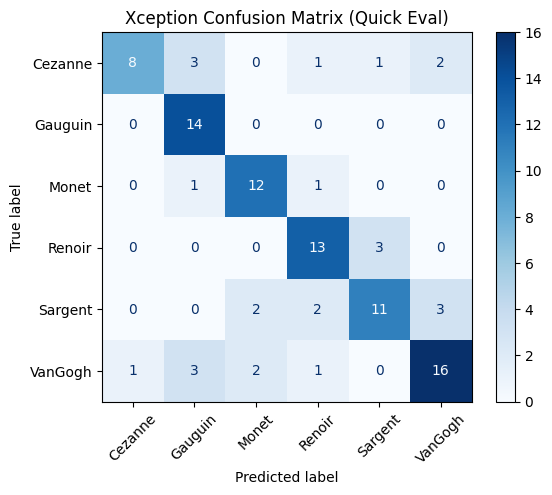

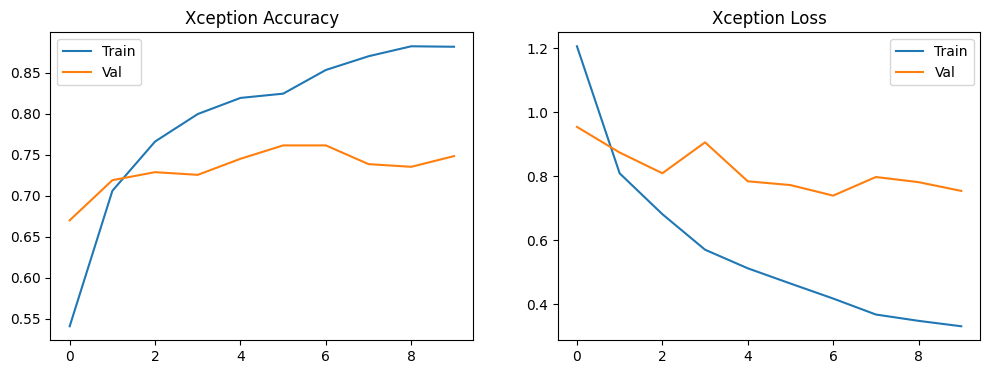

In [52]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm_x = confusion_matrix(y_true_x, y_pred_x)

plt.figure(figsize=(8,6))
disp = ConfusionMatrixDisplay(cm_x, display_labels=CLASS_NAMES)
disp.plot(cmap='Blues', xticks_rotation=45)
plt.title("Xception Confusion Matrix (Quick Eval)")
plt.show()

plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.plot(history_x.history['accuracy'], label='Train')
plt.plot(history_x.history['val_accuracy'], label='Val')
plt.title("Xception Accuracy")
plt.legend()

plt.subplot(1,2,2)
plt.plot(history_x.history['loss'], label='Train')
plt.plot(history_x.history['val_loss'], label='Val')
plt.title("Xception Loss")
plt.legend()

plt.show()


In [56]:
# في آخر النوتة، ضف هذا الكود لحفظ كل شيء
print(" Saving everything...")

# 1. احفظ الموديلات
model.save("efficientnetb0_final.h5")
print(" EfficientNetB0 saved")


vgg_model.save("vgg16_final.h5")
print("VGG16 saved")


resnet_model.save("resnet_final.h5")
print("ResNet saved")


model_x.save("xception_final.h5")
print("Xception saved")



# 2. احفض الclass names
import pickle
with open('class_names.pkl', 'wb') as f:
    pickle.dump(CLASS_NAMES, f)

# 3. احفظ الtest accuracy
import json

results = {
    "efficientnet_accuracy": float(accuracy),
    "resnet_accuracy": float(resnet_accuracy) if 'resnet_accuracy' in globals() else None,
    "vgg_accuracy": float(vgg_accuracy) if 'vgg_accuracy' in globals() else None,
    "xception_accuracy": float(accuracy_x) if 'accuracy_x' in globals() else None
}

# Determine best model safely
best_model = "RESNET"
best_acc = accuracy

if 'resnet_accuracy' in globals() and resnet_accuracy is not None:
    if resnet_accuracy > best_acc:
        best_acc = resnet_accuracy
        best_model = "ResNet"

if 'vgg_accuracy' in globals() and vgg_accuracy is not None:
    if vgg_accuracy > best_acc:
        best_acc = vgg_accuracy
        best_model = "VGG16"

if 'accuracy_x' in globals() and accuracy_x is not None:
    if accuracy_x > best_acc:
        best_acc = accuracy_x
        best_model = "Xception"

results["best_model"] = best_model
results["best_accuracy"] = float(best_acc)

with open("model_results.json", "w") as f:
    json.dump(results, f, indent=4)

print(" Everything saved successfully!")


 Saving everything...
 EfficientNetB0 saved


VGG16 saved


ResNet saved
Xception saved
 Everything saved successfully!
